In [1]:
import pandas as pd
import numpy as np
import re
import string
import unicodedata
import plotly_express as px
import plotly.io as pio
from sklearn import preprocessing
import pandas_profiling
import datetime
%matplotlib inline
import matplotlib.style
import matplotlib as mpl
import matplotlib.pyplot as plt 
from sklearn import preprocessing
import warnings
import math
import plotly.express as px
import statsmodels
import scipy
import sklearn
from statsmodels.tsa.arima_model import ARMA,ARMAResults,ARIMA,ARIMAResults
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf # for determining (p,q) orders
from pmdarima import auto_arima # for determining ARIMA orders
from statsmodels.tsa.seasonal import seasonal_decompose      # for ETS Plots
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.statespace.tools import diff
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import grangercausalitytests


import math


warnings.filterwarnings("ignore")

# scipy
print('scipy: %s' % scipy.__version__)
# numpy
print('numpy: %s' % np.__version__)
# matplotlib
print('matplotlib: %s' % matplotlib.__version__)
# pandas
print('pandas: %s' % pd.__version__)
# scikit-learn
print('sklearn: %s' % sklearn.__version__)
# statsmodels
print('statsmodels: %s' % statsmodels.__version__)
#print('unicodedata: %s' % unicodedata.__version__)

#print('unicodedata: %s' % unicodedata.__version__)

scipy: 1.4.1
numpy: 1.18.2
matplotlib: 3.2.1
pandas: 1.0.3
sklearn: 0.22.2.post1
statsmodels: 0.11.1


In [2]:
import sys
print(sys.path.append("."))



None


In [3]:
def adjust(val, length= 6): return str(val).ljust(length)

In [4]:
#verificar feriados 
def isHoliday(dia,mes):
    if dia == 1:
        if mes == 1 or mes ==5:
            return(True)
    if (dia ==2 or dia==15) and mes==11:
        return(True)
    if (dia ==7 or dia==20) and mes == 9:
        return(True)
    if mes == 4 and dia==21:
        return(True)    
    if mes==10 and (dia==12):
        return(True)
    if mes==12 and (dia ==25 or dia ==24):
        return(True)
    if mes==12 and dia==31:
        return(True)
    return(False)   

def AdjustFeriado(x):
    #print(x)
    if x['Feriado'] == 0 or x['Feriado'] == 1:
        return(x['Feriado'])
       # print('else')
       # print(x['Feriado'] >=0)
    else:
        dia = x['judgmentDate'].day
        mes = x['judgmentDate'].month 
        feriado = 0 if isHoliday(dia,mes) == True else 1
        return(feriado)
    
def AdjustWeekDay(x):    
    if x['weekDay'] > 0:
        return(x['weekDay'])
    else:
        return(x['judgmentDate'].weekday())        
    
def AdjustWeekType(x):    
    if x['weekType'] > 0:
        return(x['weekType'])
    else:
        weekType = 1 if x['judgmentDate'].weekday() <5 else 0
        return(weekType)     

In [5]:
from statsmodels.tsa.stattools import adfuller

def adf_teste(series,title='',prints=False):    
    summay = ''
    if prints:
        print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC',) 
    
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)

    for key,val in result[4].items():        
        out[f'critical value ({key})']=val
        
    if prints:
        display(pd.DataFrame(out))
    
    
    
    if result[1] <= 0.05:
        summary = "Strong evidence against the null hypothesis \n Reject the null hypothesis \n Data has no unit root and is stationary"
        if prints:
            print("Strong evidence against the null hypothesis")
            print("Reject the null hypothesis")
            print("Data has no unit root and is stationary")        
    else:
        summary = "Weak evidence against the null hypothesis \n Fail to reject the null hypothesis \n Data has a unit root and is non-stationary"
        if prints:
            print("Weak evidence against the null hypothesis")
            print("Fail to reject the null hypothesis")
            print("Data has a unit root and is non-stationary")
            
    
    return(result[1],title,result[0],result[2],result[3],result[4],result[5],summary) 

def TooDifferent(item1,item2):
    print(df[item1].sum(),'',df[item2].sum())
    return (df[item1].sum()/10 >  df[item2].sum() or  df[item2].sum()/10 >  df[item1].sum())

In [6]:
from statsmodels.tsa.stattools import acf

def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None],actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None],actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    return({'mape':mape, 'me':me, 'mae': mae,'mpe': mpe, 'rmse':rmse, 'corr':corr, 'minmax':minmax})

def verifyErrors(forecast,actual,colunas):        
    for i in colunas:
        print(i)
        itemI = i.replace('_forecast','')
        print(f'Forecast Accuracy of: {itemI}')
        accuracy_prod = forecast_accuracy(df_results[i].values, dfVAR2_test[itemI])
        for k, v in accuracy_prod.items():
            print(adjust(k), ': ', round(v,4))
        print('\n')

In [7]:
#carrega
df_count_day_type = pd.read_csv('./data_joao/df_count_day_type_modificado.csv',sep=",")#,parse_dates=['judgmentDate'])
df_count_week_day_type = pd.read_csv('./data_joao/df_count_week_day_type_modificado.csv',sep=",")
df_count_year_month_type = pd.read_csv('./data_joao/df_count_year_month_type_modificado.csv',sep=",")

dfUniqueTypes = df_count_day_type['type'].unique()

#cria indice
df_count_day_type.index = pd.to_datetime(df_count_day_type['judgmentDate'])
df_count_year_month_type.index = pd.to_datetime(df_count_year_month_type['yearMonth'])

#deleta colunas que sobraram da importacao e da criacao do indice
del df_count_day_type['Unnamed: 0']
del df_count_week_day_type['Unnamed: 0']
del df_count_year_month_type['Unnamed: 0']
del df_count_day_type['judgmentDate']
del df_count_year_month_type['yearMonth']

#calcula o total do dia
df_count_day_type['total'] = df_count_day_type.groupby(['judgmentDate'])['count'].agg('sum')
#salva as informacoes que nao serao pivotadas
ref = df_count_day_type[['weekDay','weekType','Feriado','total']]
#realiza o pivot
df_count_day_typeGRP = df_count_day_type.pivot(columns='type', values='count').fillna(0)

#transforma tudo pra int (count)
for i in df_count_day_typeGRP.columns:    
        df_count_day_typeGRP[i] = df_count_day_typeGRP[i].astype(int)
        
#faz o merge com as que foram salvas antes do pivot        
df_count_day_typeGRP = pd.merge(df_count_day_typeGRP,ref,on='judgmentDate',how='left')
df_count_day_typeGRP = df_count_day_typeGRP.fillna(0)
df_count_day_typeGRP = df_count_day_typeGRP.sort_values(by='judgmentDate').drop_duplicates()

#remove duplicadas e nulas pra fazer a frequencia diaria
df_count_day_typeGRP = df_count_day_typeGRP.sort_values(by='judgmentDate')
df_count_day_typeGRP = df_count_day_typeGRP.drop_duplicates()
df_count_day_typeGRP = df_count_day_typeGRP.dropna()


df_count_day_typeGRP.sort_values(by='judgmentDate')
df_count_day_typeGRP['Feriado'] = df_count_day_typeGRP['Feriado'].apply( lambda x: 0 if x==True else 1)
df_count_day_typeGRP['weekType'] = pd.get_dummies(df_count_day_typeGRP['weekType'])
df_count_day_typeGRP = df_count_day_typeGRP.asfreq('D') #precisa pois abaixo seto os que faltam

#reseta o indice agora com todos os dias inclusive vazios e seta as informaçoes das datas novas (sem dados)
df_count_day_typeGRP = df_count_day_typeGRP.reset_index()    
df_count_day_typeGRP['Feriado'] = df_count_day_typeGRP.apply(AdjustFeriado,axis=1)
df_count_day_typeGRP['weekDay'] = df_count_day_typeGRP.apply(AdjustWeekDay,axis=1)
df_count_day_typeGRP['weekType'] = df_count_day_typeGRP.apply(AdjustWeekType,axis=1)

#volta ao estado normal (com indice e frequencia)
df_count_day_typeGRP.index = df_count_day_typeGRP['judgmentDate']
del df_count_day_typeGRP['judgmentDate']
df_count_day_typeGRP = df_count_day_typeGRP.asfreq('D')

#seta para zerado as datas que nao existiam antes 
df_count_day_typeGRP = df_count_day_typeGRP.fillna(0)

for i in df_count_day_typeGRP.columns:    
        df_count_day_typeGRP[i] = df_count_day_typeGRP[i].astype(int)


In [8]:
dfOutli = []
df = df_count_day_typeGRP.resample('QS').sum().copy()
df = df['2012-01-01':]
valor = df['total'].sum()# - 1619483 - 1366115 - 813246
for i in df.columns:    
    dfOutli.append({'nome':i,'Qtd':df[i].sum(),'Percent':round((df[i].sum()*100)/valor,2),'QtdDiasZero':df[df[i]==0][[i]].count().item(),'QtdNaoZero':df[df[i]!=0][[i]].count().item()})

    
#PEGAR SO AQUELES QUE TEM QUANTIDADE SENAO NAO ADIANTA FAZER VAR
    
dfValidTypes = pd.DataFrame(dfOutli).sort_values(by='Percent',ascending=False)
# ver apenas aqueles que tem dados em pelo menos 50% ou mais dos quartis
#display(dfValidTypes[dfValidTypes['QtdNaoZero']>12])

dfListOfTypes = np.array(dfValidTypes[dfValidTypes['QtdNaoZero']>12]['nome'])
dfListOfTypes = np.append(dfListOfTypes,'weekDay')
dfListOfTypes = np.append(dfListOfTypes,'weekType')
dfListOfTypes = np.append(dfListOfTypes,'Feriado')
dfListOfTypes

array(['total', 'Apelação Cível', 'Agravo de Instrumento',
       'Embargos de Declaração', 'Recurso Cível', 'Agravo',
       'Apelação Crime', 'Habeas Corpus', 'Apelação e Reexame Necessário',
       'Reexame Necessário', 'Recurso Crime', 'Conflito de Competência',
       'Recurso em Sentido Estrito', 'Agravo Regimental',
       'Mandado de Segurança', 'Embargos Infringentes e de Nulidade',
       'weekDay', 'Embargos Infringentes', 'Ação Rescisória',
       'Revisão Criminal', 'Correição Parcial', 'Conflito de Jurisdição',
       'Feriado', 'Mandado de Injunção', 'Agravo Interno', 'weekType',
       'Ação Direta de Inconstitucionalidade', 'Petição',
       'Exceção de Suspeição', 'Mandado de Segurança Crime',
       'Incidente de Uniformizacao Jurisprudencia', 'Carta Testemunhável',
       'Representação Criminal', 'Recurso de Ofício',
       'Cautelar Inominada', 'Ação Penal',
       'Uniformização de Jurisprudência', 'Termo Circunstanciado',
       'Restauração de Autos', 'Medida C



# Configuracoes gerais 

In [9]:
df_count_day_typeGRP.head(3)
df = df_count_day_typeGRP

#USAR SOMENTE SERIES QUE NAO CONTENHAM POUCOS REGISTROS 
df = df[dfListOfTypes]
dfMonth = df.resample('MS').sum()
dfQuarter = df.resample('QS').sum()
dfYear = df.resample('Y').sum()
dfAllPeriod = df.resample('30A').sum()

#tamanho padrao das figuras
figsize=(12,8)
#campo a ser analisada a serie temporal
field = 'total'
#Porcentagem do Teste em relação ao treino
testPercentSize=20
#quantos periodos a frente deve ser feita a predição
predictFieldPeriod=12
#indique a sazonalidade do periodo
sazonalPeriod = 12 
#campos que serão analisados no VAR
VARFields = ['Apelação Cível', 'Agravo de Instrumento','Embargos de Declaração'
                    , 'Recurso Cível', 'Agravo','Apelação Crime',
                   'Habeas Corpus','Apelação e Reexame Necessário','Reexame Necessário','Recurso Crime']

#ESCOLHER QUAL A PERIODICIDADE PARA FAZER AS PREDICOES
dfChoosed = dfMonth.copy()


In [10]:
dfDiff = dfChoosed.copy()

while(adf_teste(dfDiff[field],'',False)[0] >0.05):    
    dfDiff[field] = diff(dfDiff[field],k_diff=1)
    dfDiff = dfDiff.dropna()

In [11]:
test_size = (len(dfDiff) - int((testPercentSize * len(dfDiff))/100))
trainDiff = dfDiff.iloc[:test_size]
testDiff = dfDiff.iloc[test_size:]    


test_size = (len(dfChoosed) - int((testPercentSize * len(dfChoosed))/100))
train = dfChoosed.iloc[:test_size]
test = dfChoosed.iloc[test_size:]   

In [12]:
print(len(trainDiff),len(testDiff))
print(len(train),len(test))

display(trainDiff.head())
display(train.head())

172 43
173 43


,total,Apelação Cível,Agravo de Instrumento,Embargos de Declaração,Recurso Cível,Agravo,Apelação Crime,Habeas Corpus,Apelação e Reexame Necessário,Reexame Necessário,...,Medida Cautelar,Desaforamento,Crimes contra a honra,Incidente de Inconstitucionalidade,Impugnação à Assistência Judiciária,Impugnação ao Valor da Causa,Inquérito Policial,weekDay,weekType,Feriado
judgmentDate,,,,,,,,,,,,,,,,,,,,,
2000-02-01,212.0,151,35,2,0,4,1,0,25,1,...,0,0,0,0,0,0,0,85,21,29
2000-03-01,351.0,277,93,30,0,17,5,0,118,21,...,0,0,0,0,0,0,0,93,23,31
2000-04-01,74.0,343,145,19,0,18,3,2,89,14,...,0,0,0,0,0,0,0,95,20,29
2000-05-01,449.0,595,318,78,0,11,7,3,53,16,...,1,0,0,0,0,1,0,87,23,30
2000-06-01,1209.0,1170,410,362,0,58,45,26,156,16,...,0,0,0,0,0,0,0,91,22,30


,total,Apelação Cível,Agravo de Instrumento,Embargos de Declaração,Recurso Cível,Agravo,Apelação Crime,Habeas Corpus,Apelação e Reexame Necessário,Reexame Necessário,...,Medida Cautelar,Desaforamento,Crimes contra a honra,Incidente de Inconstitucionalidade,Impugnação à Assistência Judiciária,Impugnação ao Valor da Causa,Inquérito Policial,weekDay,weekType,Feriado
judgmentDate,,,,,,,,,,,,,,,,,,,,,
2000-01-01,10,0,10,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,84,21,29
2000-02-01,222,151,35,2,0,4,1,0,25,1,...,0,0,0,0,0,0,0,85,21,29
2000-03-01,573,277,93,30,0,17,5,0,118,21,...,0,0,0,0,0,0,0,93,23,31
2000-04-01,647,343,145,19,0,18,3,2,89,14,...,0,0,0,0,0,0,0,95,20,29
2000-05-01,1096,595,318,78,0,11,7,3,53,16,...,1,0,0,0,0,1,0,87,23,30


In [13]:
df_count_day_type.groupby('type').count().query('count > 300').sort_values(by='count',ascending=False)

,count,weekDay,weekType,Dia,Mes,Ano,Feriado,total
type,,,,,,,,
Agravo de Instrumento,5369,5369,5369,5369,5369,5369,5369,5369
Apelação Cível,5029,5029,5029,5029,5029,5029,5029,5029
Embargos de Declaração,4274,4274,4274,4274,4274,4274,4274,4274
Apelação e Reexame Necessário,4148,4148,4148,4148,4148,4148,4148,4148
Agravo,3739,3739,3739,3739,3739,3739,3739,3739
Reexame Necessário,3692,3692,3692,3692,3692,3692,3692,3692
Habeas Corpus,3578,3578,3578,3578,3578,3578,3578,3578
Conflito de Competência,3369,3369,3369,3369,3369,3369,3369,3369
Mandado de Segurança,3338,3338,3338,3338,3338,3338,3338,3338


In [14]:
from random import randrange
from pandas import Series
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
series = [i+randrange(10) for i in range(1,100)]
result = seasonal_decompose(dfChoosed[field], model='additive', freq=12)

dfChoosedAnalisys = dfChoosed[[field]].copy()
dfChoosedAnalisys['month'] = dfChoosedAnalisys.index.month
#display(dfChoosedAnalisys.head(2))

from pylab import rcParams
rcParams['figure.figsize'] = 15, 8

#result.plot()
#result.trend.rename('Tendencia').plot(legend=True);
#result.observed.rename('Dados Observados').plot(legend=True);




# Analise do período de sazonalidade 

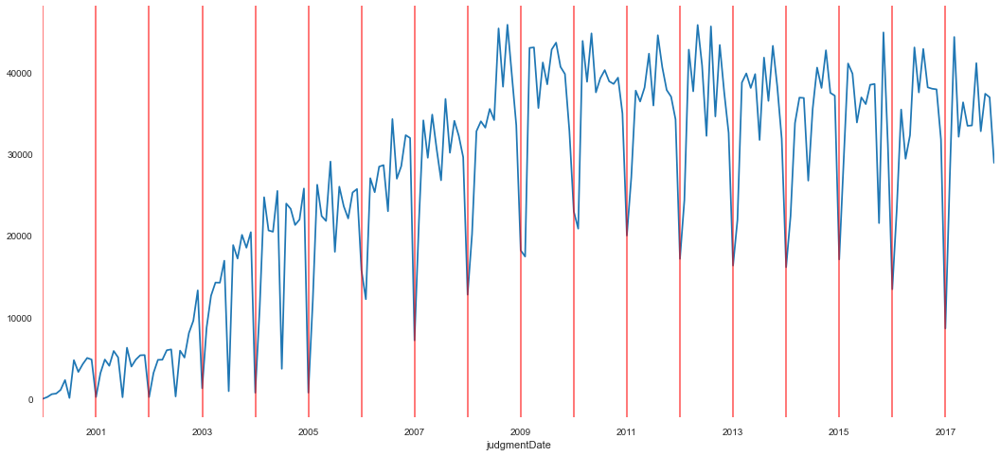

In [15]:
ax = result.observed.rename('Dados Observados').plot(figsize=(18,8))
ax.autoscale(axis='x',tight=True)
for x in dfChoosedAnalisys[[field,'month']].query('month==1').index: 
    ax.axvline(x=x, color='red', alpha = 0.6);
   
#result.resid.plot(legend=True);
#seasonal_decompose(dfChoosed.diff()[field].dropna(), model='additive').observed.plot(legend=True)

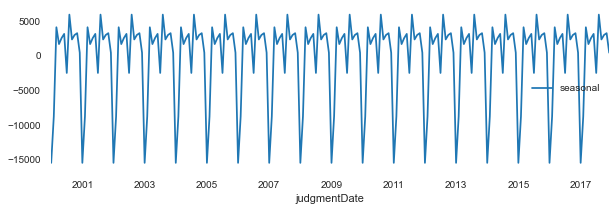

In [16]:
result.seasonal.plot(figsize=(10,3),legend=True);

# Simple Exponential Smoothing

### Exponential Smoothing ocorre sobre dados não estácionarios

In [17]:
dfSimpleExpSmooth = dfChoosed.dropna()
dfSimpleExpSmooth = dfSimpleExpSmooth[[field]]

Index(['total', 'EWMA12', 'SES12', 'DESadd12', 'DESmul12'], dtype='object')
SES12 6361.357413657494
DESadd12 6851.037176197621
DESmul12 4686.39952461157
EWMA12 6351.3218218834545


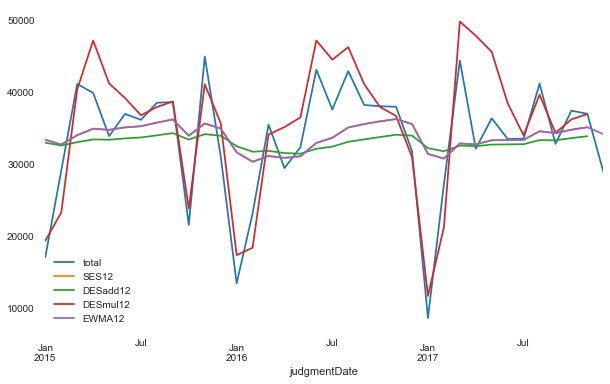

In [18]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing


span = predictFieldPeriod
alpha = 2/(span+1)

SimpleExpSmoothFields = [field]


dfSimpleExpSmooth['EWMA'+str(predictFieldPeriod)] = dfSimpleExpSmooth[field].ewm(alpha=alpha,adjust=True).mean()
dfSimpleExpSmooth['SES'+str(predictFieldPeriod)]= SimpleExpSmoothing(dfSimpleExpSmooth[field]).fit(smoothing_level=alpha,optimized=False).fittedvalues.shift(-1)

dfSimpleExpSmooth['DESadd'+str(predictFieldPeriod)] = ExponentialSmoothing(dfSimpleExpSmooth[field], trend='add').fit().fittedvalues.shift(-1)
try:
    dfSimpleExpSmooth['DESmul'+str(predictFieldPeriod)] = ExponentialSmoothing(dfSimpleExpSmooth[field], trend='mul').fit().fittedvalues.shift(-1)
except:
    print('erro mul')
    
print(dfSimpleExpSmooth.columns)
    
dfSimpleExpSmooth[['total', 'SES12', 'DESadd12', 'DESmul12','EWMA12']].tail(36).plot(figsize=(10,6)).autoscale(axis='x',tight=True);



print("SES12",forecast_accuracy(dfSimpleExpSmooth['SES12'],dfSimpleExpSmooth['total'])['rmse'])
print("DESadd12",forecast_accuracy(dfSimpleExpSmooth['DESadd12'],dfSimpleExpSmooth['total'])['rmse'])
print("DESmul12",forecast_accuracy(dfSimpleExpSmooth['DESmul12'],dfSimpleExpSmooth['total'])['rmse'])
print("EWMA12",forecast_accuracy(dfSimpleExpSmooth['EWMA12'],dfSimpleExpSmooth['total'])['rmse'])


In [19]:
dfSimpleExpSmooth[['total', 'SES12', 'DESadd12', 'DESmul12','EWMA12']]['2015':]

,total,SES12,DESadd12,DESmul12,EWMA12
judgmentDate,,,,,
2015-01-01,17090,33361.557559,32956.155123,19349.197506,33361.557559
2015-02-01,29078,32702.548704,32564.003005,23263.800396,32702.548704
2015-03-01,41108,33995.695057,33027.070580,40346.657366,33995.695057
2015-04-01,39858,34897.588125,33406.918097,47134.631047,34897.588125
2015-05-01,33874,34740.113029,33369.636566,41178.339446,34740.113029
2015-06-01,36951,35080.249486,33553.001242,39148.437892,35080.249486
2015-07-01,36128,35241.441873,33681.244032,36753.142902,35241.441873
2015-08-01,38498,35742.450815,33978.019566,37906.986546,35742.450815
2015-09-01,38595,36181.304536,34281.650700,38677.085880,36181.304536


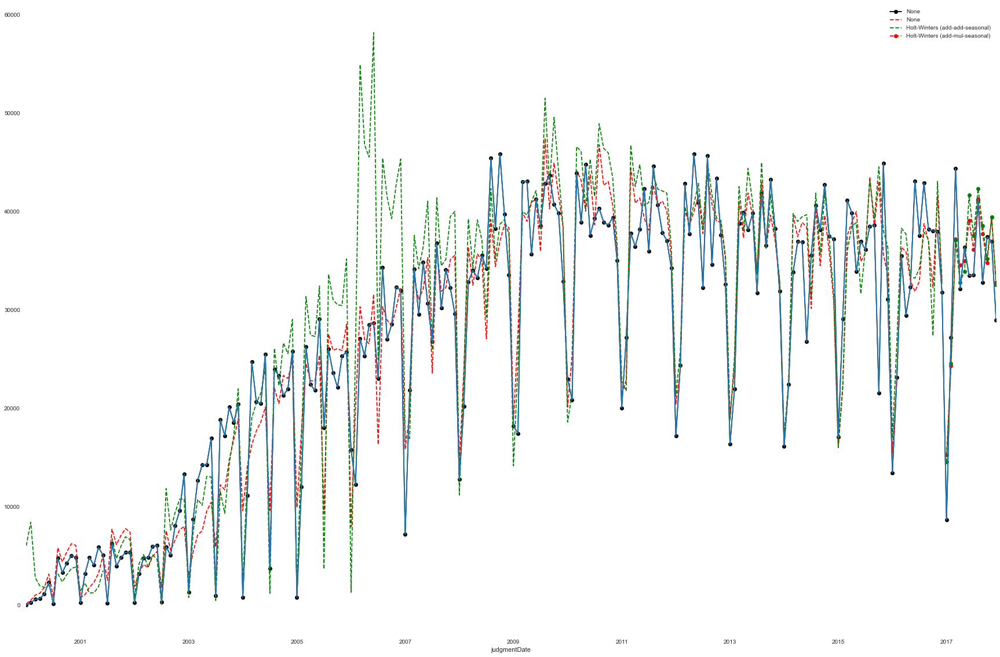

Exponential Smoothing (additional):  6716.590273332058
Exponential Smoothing (multiplicate)  7365.420027868237


In [20]:
dfSimpleExpSmoothTest = dfSimpleExpSmooth.copy()
dfSimpleExpSmoothTest=dfSimpleExpSmoothTest['2000-01-01':'2016-12-31']

fit1 = ExponentialSmoothing(dfSimpleExpSmoothTest[field], seasonal_periods=sazonalPeriod, trend='add', seasonal='add').fit(use_boxcox=True)
fit2 = ExponentialSmoothing(dfSimpleExpSmoothTest[field], seasonal_periods=sazonalPeriod, trend='add', seasonal='mul').fit(use_boxcox=True)
fit3 = ExponentialSmoothing(dfSimpleExpSmoothTest[field], seasonal_periods=sazonalPeriod, trend='add', seasonal='add', damped=True).fit(use_boxcox=True)
fit4 = ExponentialSmoothing(dfSimpleExpSmoothTest[field], seasonal_periods=sazonalPeriod, trend='add', seasonal='mul', damped=True).fit(use_boxcox=True)

results=pd.DataFrame(index=[r"$\alpha$",r"$\beta$",r"$\phi$",r"$\gamma$",r"$l_0$","$b_0$","SSE"])

params = ['smoothing_level', 'smoothing_slope', 'damping_slope', 'smoothing_seasonal', 'initial_level', 'initial_slope']
results["Additive"]       = [fit1.params[p] for p in params] + [fit1.sse]
results["Multiplicative"] = [fit2.params[p] for p in params] + [fit2.sse]
results["Additive Dam"]   = [fit3.params[p] for p in params] + [fit3.sse]
results["Multiplica Dam"] = [fit4.params[p] for p in params] + [fit4.sse]

ax = dfSimpleExpSmooth[field].plot(figsize=(30,20), marker='o', color='black')
fit1.fittedvalues.plot(ax=ax, style='--', color='red',legend=True)
fit2.fittedvalues.plot(ax=ax, style='--', color='green',legend=True)
#
fit1.forecast(predictFieldPeriod).rename('Holt-Winters (add-add-seasonal)').plot(ax=ax, style='--', marker='o', color='red', legend=True)
fit2.forecast(predictFieldPeriod).rename('Holt-Winters (add-mul-seasonal)').plot(ax=ax, style='--', marker='o', color='green', legend=True)
#
dfChoosed[field].plot()
plt.show()



HwForeCastAdd = fit1.forecast(predictFieldPeriod).rename('Holt-Winters (add-add-seasonal)')
HwForeCastMul = fit2.forecast(predictFieldPeriod).rename('Holt-Winters (add-mul-seasonal)')

display()

print("Exponential Smoothing (additional): ",forecast_accuracy(dfSimpleExpSmooth['DESmul12'][-predictFieldPeriod:],HwForeCastAdd)['rmse'])
print("Exponential Smoothing (multiplicate) ",forecast_accuracy(dfSimpleExpSmooth['DESmul12'][-predictFieldPeriod:],HwForeCastMul)['rmse'])

# Autoregressive Model

In [21]:
dfChoosedAR = dfChoosed.copy()
dfDiffAR = dfDiff.copy()

AR(1) : 11018.575977425984
AR(2) : 10181.79148359231
AR(14) : 6184.545540141704


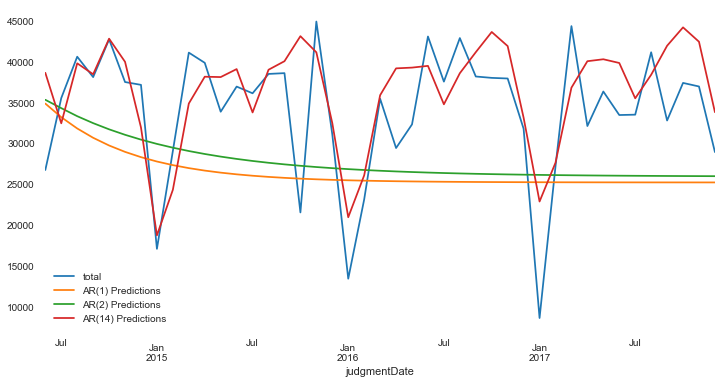

In [22]:
from statsmodels.tsa.ar_model import AR,ARResults

arTrain=train 
arTest=test


modelArima = AR(arTrain[field])
AR1fit = modelArima.fit(maxlag=1,method='cmle')
#print(f'Lag: {AR1fit.k_ar}')
#print(f'Coefficients:\n{AR1fit.params}')

start=len(arTrain)
end=len(arTrain)+len(arTest)-1
predictions1 = AR1fit.predict(start=start, end=end, dynamic=False).rename('AR(1) Predictions')

modelArima2 = AR(arTrain[field])
AR2fit = modelArima2.fit(maxlag=2,method='cmle')
predictions2 = AR2fit.predict(start=start, end=end, dynamic=False).rename('AR(2) Predictions')

modelArima3 = AR(arTrain[field])

AR3fit = modelArima3.fit(method='cmle')
#print(f'Lag: {AR3fit.k_ar}')
#print(f'Coefficients:\n{AR3fit.params}')
rename = f'AR({AR3fit.k_ar}) Predictions'

predictions11 = AR3fit.predict(start=start,end=end,dynamic=False).rename( f'AR({AR3fit.k_ar}) Predictions')

arTest[field].plot(legend=True)
predictions1.plot(legend=True)
predictions2.plot(legend=True)
predictions11.plot(legend=True,figsize=(12,6));

from sklearn.metrics import mean_squared_error
labelsAR = ['AR(1)','AR(2)',f'AR({AR3fit.k_ar})']
ArimaPreds = [predictions1, predictions2, predictions11]  # these are variables, not strings!
ArimaPredsResult = []

for i in range(3):
    print(labelsAR[i],':',forecast_accuracy(arTest[field], ArimaPreds[i])['rmse'])
    ArimaPredsResult.append(forecast_accuracy(arTest[field], ArimaPreds[i])['rmse'])
    #error = mean_squared_error(test[field], preds[i])
    #print(f'{labels[i]} Error: {error:11.10}')


# CMLE foi melhor do que MLE

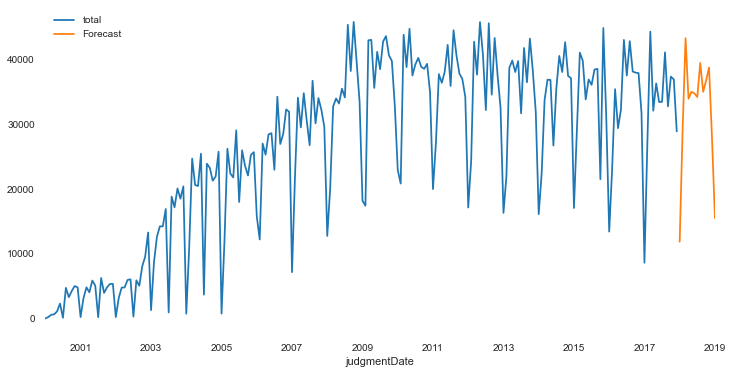

In [23]:
modelARForecast = AR(dfChoosedAR[field])
ARfitForecast = modelARForecast.fit(maxlag=AR3fit.k_ar,method='cmle')
# Make predictions
fcastAR = ARfitForecast.predict(start=len(dfChoosedAR), end=len(dfChoosedAR)+predictFieldPeriod, dynamic=False).rename('Forecast')
dfChoosedAR[field].plot(legend=True)
fcastAR.plot(legend=True,figsize=(12,6));

# Tests for Stationarity

A time series is stationary if the mean and variance are fixed between any two equidistant points. That is, no matter where you take your observations, the results should be the same. A times series that shows seasonality is not stationary.

A test for stationarity usually involves a unit root hypothesis test, where the null hypothesis  𝐻0  is that the series is nonstationary, and contains a unit root. The alternate hypothesis  𝐻1  supports stationarity. The augmented Dickey-Fuller and Kwiatkowski-Phillips-Schmidt-Shin tests are stationarity tests.

## Augmented Dickey-Fuller Test
To determine whether a series is stationary we can use the <a href='https://en.wikipedia.org/wiki/Augmented_Dickey-Fuller_test'>augmented Dickey-Fuller Test</a>. In this test the null hypothesis states that $\phi = 1$ (this is also called a unit test). The test returns several statistics we'll see in a moment. Our focus is on the p-value. A small p-value ($p<0.05$) indicates strong evidence against the null hypothesis.

To demonstrate, we'll use a dataset we know is <em>not</em> stationary, the airline_passenger dataset. First, let's plot the data along with a 12-month rolling mean and standard deviation:

In [24]:
#adf_teste(dfChoosed[field])
print(adf_teste(dfChoosed[field]))
print(adf_teste(dfDiff[field]))

(0.10219011015738777, '', -2.5571079596619577, 14, 201, {'1%': -3.4633090972761744, '5%': -2.876029332045744, '10%': -2.5744932593252643}, 3953.4211936388106, 'Weak evidence against the null hypothesis \n Fail to reject the null hypothesis \n Data has a unit root and is non-stationary')
(0.005359290063266703, '', -3.6217099251587053, 15, 199, {'1%': -3.4636447617687436, '5%': -2.8761761179270766, '10%': -2.57457158581854}, 3939.1954624144064, 'Strong evidence against the null hypothesis \n Reject the null hypothesis \n Data has no unit root and is stationary')


## TESTANDO SAZONALIDADE COM GRAFICO

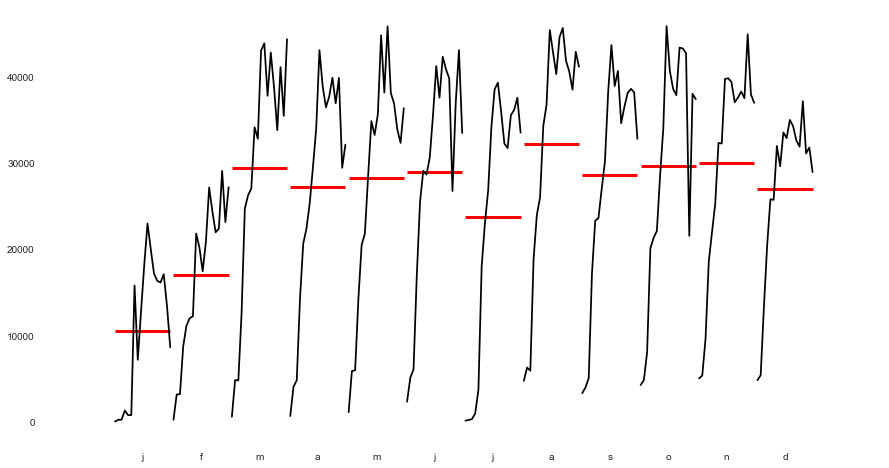

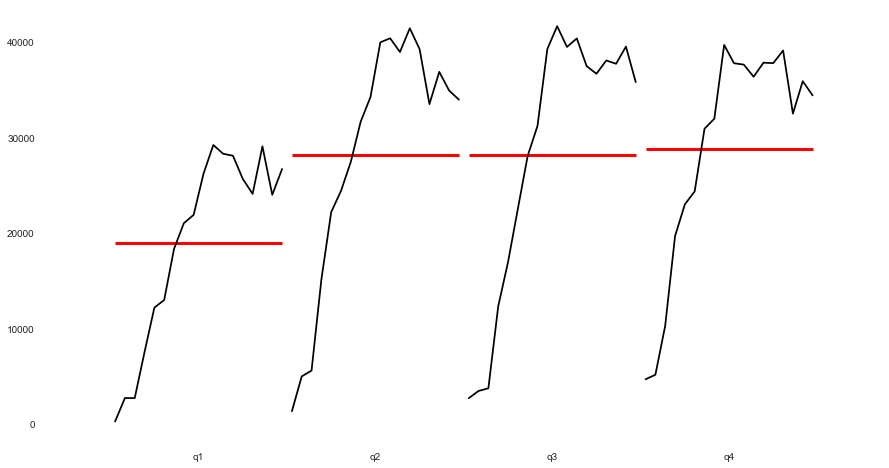

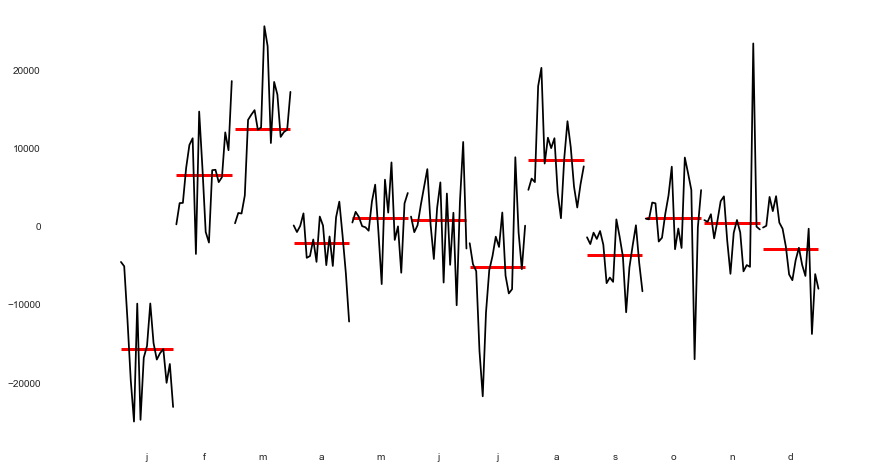

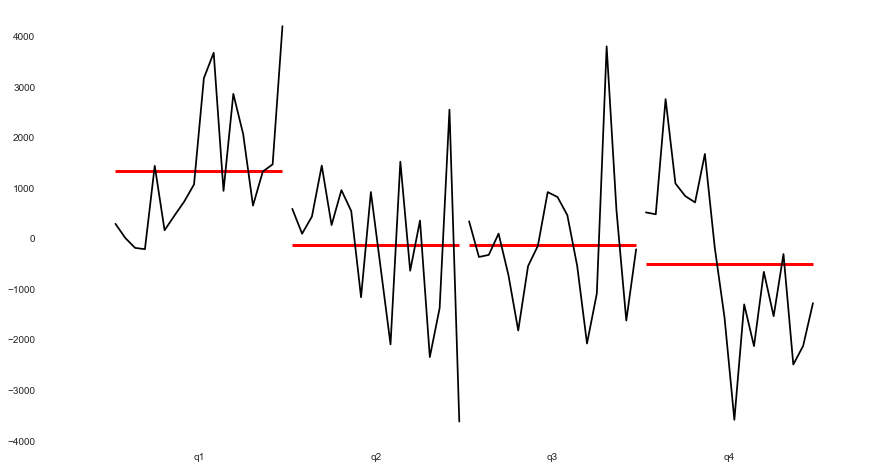

In [25]:
from statsmodels.graphics.tsaplots import month_plot,quarter_plot
month_plot(dfChoosed[field]);

dfq = dfChoosed[field].resample(rule='Q').mean()
quarter_plot(dfq);
month_plot(dfDiff[field]);
dfq = dfDiff[field].resample(rule='Q').mean()
quarter_plot(dfq);

# ARMA

# EXEMPLO ARMA SEM INDICAR SAZONALIDADE 

In [26]:
auto_arima(trainDiff[field],seasonal=True).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  172
Model:               SARIMAX(1, 0, 3)   Log Likelihood               -1761.569
Date:                Sun, 24 May 2020   AIC                           3535.138
Time:                        11:34:03   BIC                           3554.023
Sample:                             0   HQIC                          3542.800
                                - 172                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    328.1127    223.097      1.471      0.141    -109.150     765.375
ar.L1         -0.9993      0.004   -223.472      0.000      -1.008      -0.991
ma.L1          0.4950      0.099      4.987      0.000       0.300       0.690
ma.L2         -0.8607      0.068    -12.618      0.000      -0.994      -0.727
ma.L3         -0.3664      0.106     -3.456      0.001      -0.574      -0.159
sigma2      5.395e+07      0.001   7.16e+10      0.000    5.39e+07    5.39e+07
===================================================================================
Ljung-Box (Q):                      313.93   Jarque-Bera (JB):                22.98
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.10   Skew:                            -0.72
Prob(H) (two-sided):                  0.01   Kurtosis:                         4.07
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.33e+27. Standard errors may be unstable.
"""

In [27]:
ARIMAauto_arimaNoSeasonal = auto_arima(trainDiff[field],seasonal=True,stationary=True)
ARIMAauto_arimaNoSeasonal

ARIMA(maxiter=50, method='lbfgs', order=(1, 0, 3), out_of_sample_size=0,
      scoring='mse', scoring_args=None, seasonal_order=(0, 0, 0, 0),
      start_params=None, suppress_warnings=False, trend=None,
      with_intercept=True)

In [28]:
modelARMANoSeasonal = SARIMAX(trainDiff[field],order=ARIMAauto_arimaNoSeasonal.order,seasonal_order=ARIMAauto_arimaNoSeasonal.seasonal_order)
resultARMANoSeasonal = modelARMANoSeasonal.fit()
resultARMANoSeasonal.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  total   No. Observations:                  172
Model:               SARIMAX(1, 0, 3)   Log Likelihood               -1764.662
Date:                Sun, 24 May 2020   AIC                           3539.324
Time:                        11:34:04   BIC                           3555.062
Sample:                    02-01-2000   HQIC                          3545.709
                         - 05-01-2014                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9904      0.021    -48.171      0.000      -1.031      -0.950
ma.L1          0.5275      0.111      4.768      0.000       0.311       0.744
ma.L2         -0.7983      0.073    -10.901      0.000      -0.942      -0.655
ma.L3         -0.3716      0.093     -3.990      0.000      -0.554      -0.189
sigma2      5.709e+07   5.98e-10   9.54e+16      0.000    5.71e+07    5.71e+07
===================================================================================
Ljung-Box (Q):                      322.48   Jarque-Bera (JB):                24.70
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.93   Skew:                            -0.70
Prob(H) (two-sided):                  0.01   Kurtosis:                         4.21
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 8.35e+32. Standard errors may be unstable.
"""

In [29]:
resultARMANoSeasonal.predict(len(dfChoosed),len(dfChoosed)+predictFieldPeriod,type='levels')

2018-02-01    1127.498473
2018-03-01   -1116.635513
2018-04-01    1105.877213
2018-05-01   -1095.222564
2018-06-01    1084.670569
2018-07-01   -1074.220237
2018-08-01    1063.870590
2018-09-01   -1053.620657
2018-10-01    1043.469478
2018-11-01   -1033.416101
2018-12-01    1023.459584
2019-01-01   -1013.598994
2019-02-01    1003.833406
Freq: MS, dtype: float64

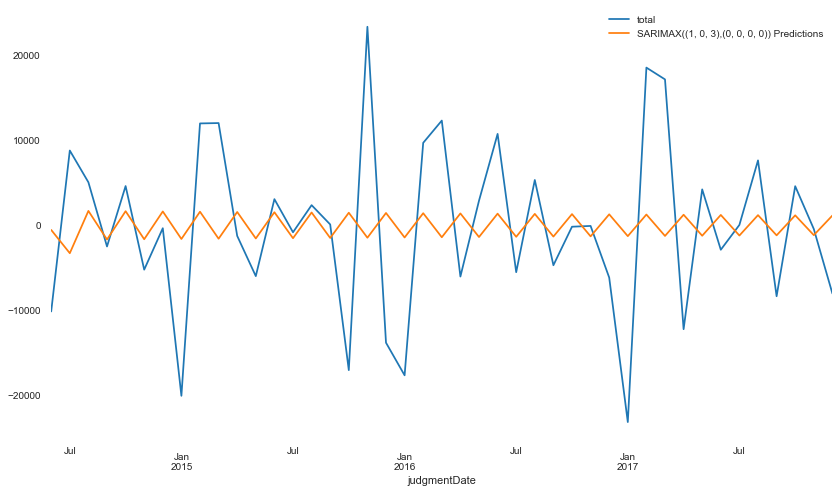

SARIMAX:                                 10182.269626958234


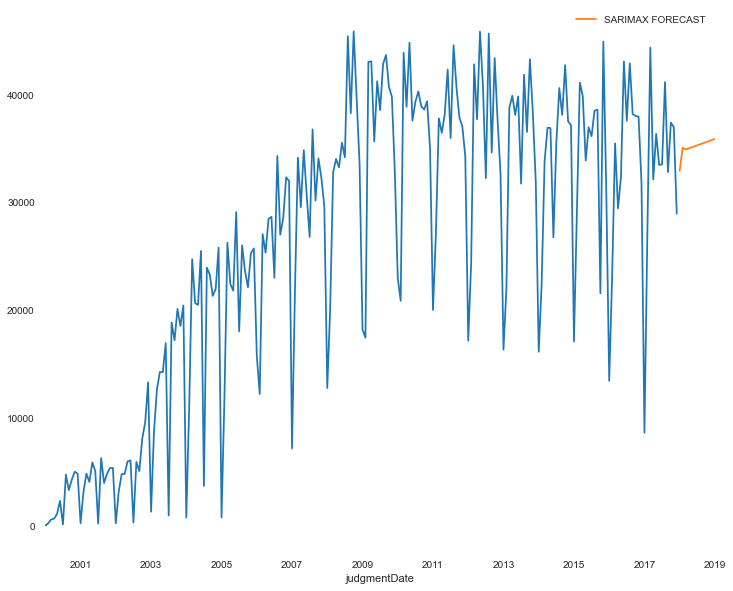

In [30]:
start=len(trainDiff)
end=len(trainDiff)+len(testDiff)-1

predictionsARMANoSeasonal = resultARMANoSeasonal.predict(start=start, end=end).rename(f'SARIMAX({ARIMAauto_arimaNoSeasonal.order},{ARIMAauto_arimaNoSeasonal.seasonal_order}) Predictions')
ax = testDiff[field].plot(legend=True,figsize=(14,8))
predictionsARMANoSeasonal.plot(legend=True)
ax.autoscale(axis='x',tight=True)
plt.show()
print(adjust('SARIMAX: ',40),forecast_accuracy(testDiff[field], predictionsARMANoSeasonal)['rmse'])

#prevendo no dataset normal
modelARIMANoSeasonal = SARIMAX(dfChoosed[field],order=ARIMAauto_arimaNoSeasonal.order,seasonal_order=ARIMAauto_arimaNoSeasonal.seasonal_order,enforce_invertibility=False,enforce_stationarity=False)
resultsForeCastARIMANoSeasonal = modelARIMANoSeasonal.fit()
fcastARIMANoSeasonal = resultsForeCastARIMANoSeasonal.predict(len(dfChoosed),len(dfChoosed)+predictFieldPeriod,type='levels')
dfChoosed[field].plot(figsize=(12,10))
fcastARIMANoSeasonal.rename('SARIMAX FORECAST').plot(legend=True)

### Teoria: ARMA

In [31]:
auto_arima(trainDiff[field],seasonal=True,m=predictFieldPeriod).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                       y   No. Observations:                  172
Model:             SARIMAX(2, 0, 0)x(2, 0, [1, 2], 12)   Log Likelihood               -1676.704
Date:                                 Sun, 24 May 2020   AIC                           3369.408
Time:                                         11:34:30   BIC                           3394.588
Sample:                                              0   HQIC                          3379.624
                                                 - 172                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    -41.8257     14.692     -2.847      0.004     -70.622     -13.029
ar.L1         -0.6925      0.060    -11.607      0.000      -0.809      -0.576
ar.L2         -0.3046      0.039     -7.859      0.000      -0.381      -0.229
ar.S.L12      -0.0565      0.026     -2.136      0.033      -0.108      -0.005
ar.S.L24       0.9435      0.053     17.902      0.000       0.840       1.047
ma.S.L12       0.6320      0.058     10.825      0.000       0.518       0.746
ma.S.L24      -0.3680      0.083     -4.443      0.000      -0.530      -0.206
sigma2      1.349e+07    8.7e-05   1.55e+11      0.000    1.35e+07    1.35e+07
===================================================================================
Ljung-Box (Q):                       58.39   Jarque-Bera (JB):                 5.00
Prob(Q):                              0.03   Prob(JB):                         0.08
Heteroskedasticity (H):               0.99   Skew:                            -0.22
Prob(H) (two-sided):                  0.98   Kurtosis:                         3.71
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.15e+27. Standard errors may be unstable.
"""

<hr>
<h1 style="color:red"> VERIFICAR RETORNO DO MODELO </h1>
<hr>

## RETORNOU PARA USO SARIMAX

In [32]:
ARIMAauto_arima = auto_arima(trainDiff[field],seasonal=True,stationary=True,m=12)
ARIMAauto_arima

ARIMA(maxiter=50, method='lbfgs', order=(2, 0, 0), out_of_sample_size=0,
      scoring='mse', scoring_args=None, seasonal_order=(2, 0, 2, 12),
      start_params=None, suppress_warnings=False, trend=None,
      with_intercept=True)

In [33]:
modelARMA = SARIMAX(trainDiff[field],order=ARIMAauto_arima.order,seasonal_order=ARIMAauto_arima.seasonal_order)
resultARMA = modelARMA.fit()
resultARMA.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                   total   No. Observations:                  172
Model:             SARIMAX(2, 0, 0)x(2, 0, [1, 2], 12)   Log Likelihood               -1675.617
Date:                                 Sun, 24 May 2020   AIC                           3365.235
Time:                                         11:34:59   BIC                           3387.267
Sample:                                     02-01-2000   HQIC                          3374.174
                                          - 05-01-2014                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6959      0.070     -9.945      0.000      -0.833      -0.559
ar.L2         -0.3064      0.075     -4.100      0.000      -0.453      -0.160
ar.S.L12       1.9447      0.059     32.919      0.000       1.829       2.061
ar.S.L24      -0.9470      0.050    -19.044      0.000      -1.044      -0.850
ma.S.L12      -1.3998      0.157     -8.925      0.000      -1.707      -1.092
ma.S.L24       0.4037      0.084      4.781      0.000       0.238       0.569
sigma2      1.511e+07   1.96e-08   7.71e+14      0.000    1.51e+07    1.51e+07
===================================================================================
Ljung-Box (Q):                       59.25   Jarque-Bera (JB):                 4.70
Prob(Q):                              0.03   Prob(JB):                         0.10
Heteroskedasticity (H):               0.98   Skew:                            -0.22
Prob(H) (two-sided):                  0.93   Kurtosis:                         3.68
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 5.42e+29. Standard errors may be unstable.
"""

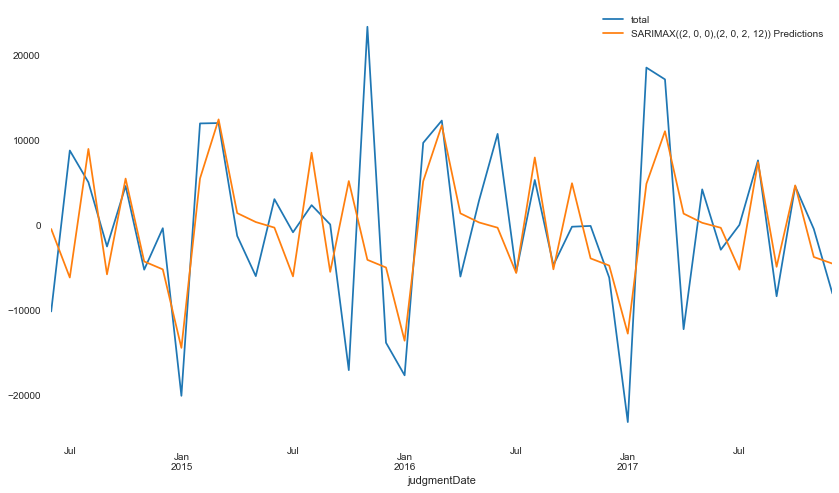

SARIMAX:                                 8067.010684513909


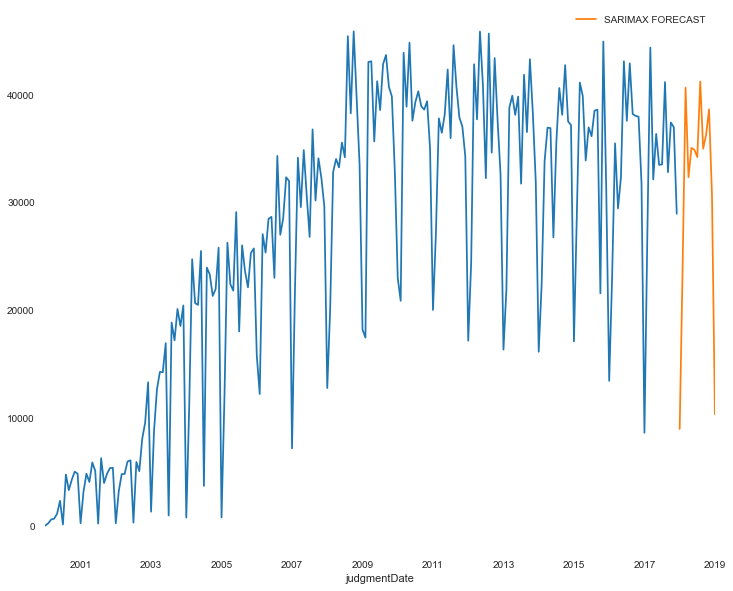

In [34]:
start=len(trainDiff)
end=len(trainDiff)+len(testDiff)-1

predictionsARMA = resultARMA.predict(start=start, end=end).rename(f'SARIMAX({ARIMAauto_arima.order},{ARIMAauto_arima.seasonal_order}) Predictions')
ax = testDiff[field].plot(legend=True,figsize=(14,8))
predictionsARMA.plot(legend=True)
ax.autoscale(axis='x',tight=True)
plt.show()
print(adjust('SARIMAX: ',40),forecast_accuracy(testDiff[field], predictionsARMA)['rmse'])

#prevendo sobre o dataset
modelARIMA = SARIMAX(dfChoosed[field],order=ARIMAauto_arima.order,seasonal_order=ARIMAauto_arima.seasonal_order,enforce_invertibility=False,enforce_stationarity=False)
resultsForeCastARIMA = modelARIMA.fit()
fcastARIMA = resultsForeCastARIMA.predict(len(dfChoosed),len(dfChoosed)+predictFieldPeriod,type='levels')
dfChoosed[field].plot(figsize=(12,10))
fcastARIMA.rename('SARIMAX FORECAST').plot(legend=True)


# TESTE SEM ESTACIONARIEDADE

In [35]:
auto_arima(train[field],seasonal=True,m=predictFieldPeriod).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                       y   No. Observations:                  173
Model:             SARIMAX(2, 1, 0)x(2, 0, [1, 2], 12)   Log Likelihood               -1675.728
Date:                                 Sun, 24 May 2020   AIC                           3367.457
Time:                                         11:35:22   BIC                           3392.637
Sample:                                              0   HQIC                          3377.673
                                                 - 173                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -9.9881     13.757     -0.726      0.468     -36.951      16.975
ar.L1         -0.6807      0.070     -9.690      0.000      -0.818      -0.543
ar.L2         -0.2885      0.069     -4.199      0.000      -0.423      -0.154
ar.S.L12      -0.0782      0.104     -0.754      0.451      -0.281       0.125
ar.S.L24       0.9218      0.100      9.263      0.000       0.727       1.117
ma.S.L12       0.6866      0.164      4.185      0.000       0.365       1.008
ma.S.L24      -0.3134      0.095     -3.297      0.001      -0.500      -0.127
sigma2       1.47e+07   2.94e-05      5e+11      0.000    1.47e+07    1.47e+07
===================================================================================
Ljung-Box (Q):                       57.98   Jarque-Bera (JB):                 5.18
Prob(Q):                              0.03   Prob(JB):                         0.07
Heteroskedasticity (H):               1.03   Skew:                            -0.19
Prob(H) (two-sided):                  0.92   Kurtosis:                         3.76
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 9.46e+26. Standard errors may be unstable.
"""

<hr>
<h1 style="color:red"> VERIFICAR RETORNO DO MODELO </h1>
<hr>

## RETORNOU PARA USO SARIMAX

In [36]:
ARIMAauto_arimaNoDiff = auto_arima(train[field],seasonal=True,stationary=True,m=12)
ARIMAauto_arimaNoDiff

ARIMA(maxiter=50, method='lbfgs', order=(2, 0, 2), out_of_sample_size=0,
      scoring='mse', scoring_args=None, seasonal_order=(2, 0, 0, 12),
      start_params=None, suppress_warnings=False, trend=None,
      with_intercept=True)

In [37]:
modelARMANoDiff = SARIMAX(train[field],order=ARIMAauto_arimaNoDiff.order,seasonal_order=ARIMAauto_arimaNoDiff.seasonal_order)
resultARMANoDiff = modelARMANoDiff.fit()
resultARMANoDiff.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               total   No. Observations:                  173
Model:             SARIMAX(2, 0, 2)x(2, 0, [], 12)   Log Likelihood               -1713.033
Date:                             Sun, 24 May 2020   AIC                           3440.066
Time:                                     11:35:53   BIC                           3462.139
Sample:                                 01-01-2000   HQIC                          3449.021
                                      - 05-01-2014                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.9963      0.038     52.684      0.000       1.922       2.071
ar.L2         -0.9963      0.038    -26.314      0.000      -1.070      -0.922
ma.L1         -1.9894      0.021    -95.942      0.000      -2.030      -1.949
ma.L2          0.9897      0.021     46.428      0.000       0.948       1.031
ar.S.L12       0.9004      0.039     23.369      0.000       0.825       0.976
ar.S.L24      -0.0276      0.011     -2.429      0.015      -0.050      -0.005
sigma2      2.532e+07   1.16e-10   2.18e+17      0.000    2.53e+07    2.53e+07
===================================================================================
Ljung-Box (Q):                      313.72   Jarque-Bera (JB):                 0.40
Prob(Q):                              0.00   Prob(JB):                         0.82
Heteroskedasticity (H):               1.38   Skew:                             0.12
Prob(H) (two-sided):                  0.22   Kurtosis:                         2.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.1e+34. Standard errors may be unstable.
"""

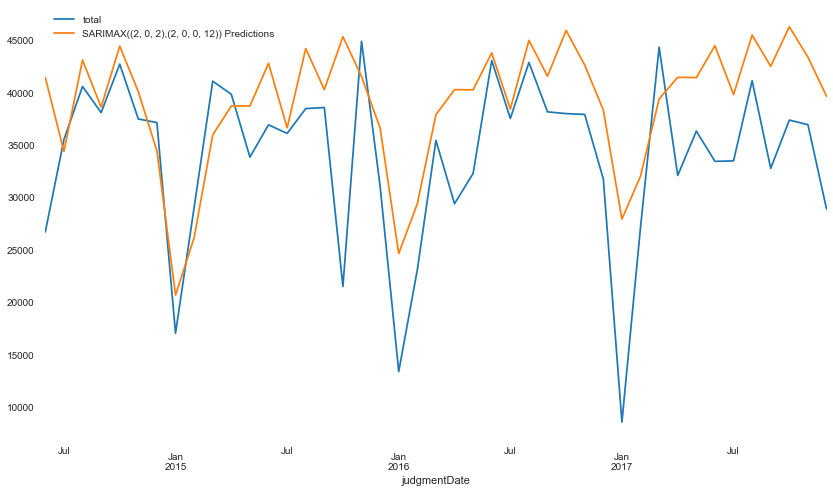

SARIMAX:                                 7682.941467137319


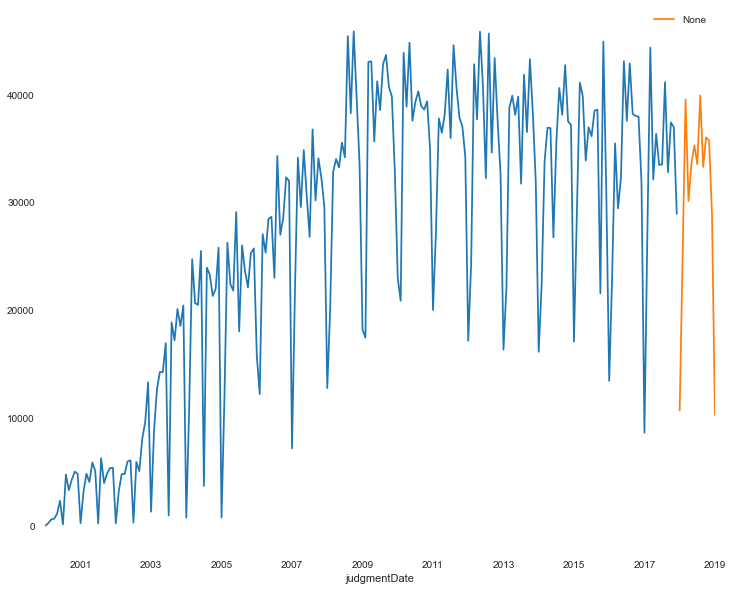

In [38]:
start=len(train)
end=len(train)+len(test) - 1

predictionsARMANodiff = resultARMANoDiff.predict(start=start, end=end).rename(f'SARIMAX({ARIMAauto_arimaNoDiff.order},{ARIMAauto_arimaNoDiff.seasonal_order}) Predictions')
ax = test[field].plot(legend=True,figsize=(14,8))
predictionsARMANodiff.plot(legend=True)
ax.autoscale(axis='x',tight=True)
plt.show()
print(adjust('SARIMAX: ',40),forecast_accuracy(test[field], predictionsARMANodiff)['rmse'])

#display(predictionsARMANodiff.order)

#prevendo sobre o dataset
modelARMANoDiff = SARIMAX(dfChoosed[[field]],order=ARIMAauto_arimaNoDiff.order,seasonal_order=ARIMAauto_arimaNoDiff.seasonal_order,enforce_invertibility=False,enforce_stationarity=False)
resultsForeCastARIMANoDiff = modelARMANoDiff.fit()
fcastARIMANoDiff = resultsForeCastARIMANoDiff.predict(len(dfChoosed),len(dfChoosed)+predictFieldPeriod,type='levels')
dfChoosed[field].plot(figsize=(12,10))
fcastARIMANoDiff.plot(legend=True)


# APLICANDO EXOGENOUS DATA 

### Teoria: ARMA

In [39]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

data = trainDiff.copy()
#display(data.head(2))

# Dados sao estacionarios devido ao diff ja feito, portanto modelo deve ser add 
result_mul = seasonal_decompose(data[field][-36:],model='add',extrapolate_trend='freq') 

seasonal_index = result_mul.seasonal[-12:].to_frame()
seasonal_index['month'] = pd.to_datetime(seasonal_index.index).month
seasonal_index.head(2)

#merge with the base data
data['month'] = data.index.month
dfSeasonalDiff = pd.merge(data, seasonal_index, how='left', on='month')
dfSeasonalDiff.index = data.index  # reassign the index.
display(dfSeasonalDiff.head(2))



#display(df.head(20))

,total,Apelação Cível,Agravo de Instrumento,Embargos de Declaração,Recurso Cível,Agravo,Apelação Crime,Habeas Corpus,Apelação e Reexame Necessário,Reexame Necessário,...,Crimes contra a honra,Incidente de Inconstitucionalidade,Impugnação à Assistência Judiciária,Impugnação ao Valor da Causa,Inquérito Policial,weekDay,weekType,Feriado,month,seasonal
judgmentDate,,,,,,,,,,,,,,,,,,,,,
2000-02-01,212.0,151,35,2,0,4,1,0,25,1,...,0,0,0,0,0,85,21,29,2,6455.244015
2000-03-01,351.0,277,93,30,0,17,5,0,118,21,...,0,0,0,0,0,93,23,31,3,15650.599590


In [40]:
auto_arima(dfSeasonalDiff[[field]],seasonal=True,m=predictFieldPeriod,exogenous=dfSeasonalDiff[['seasonal']]).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  172
Model:             SARIMAX(0, 0, 2)x(1, 0, [], 12)   Log Likelihood               -1653.107
Date:                             Sun, 24 May 2020   AIC                           3318.214
Time:                                     11:36:08   BIC                           3337.099
Sample:                                 02-01-2000   HQIC                          3325.876
                                      - 05-01-2014                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     73.5963     54.072      1.361      0.173     -32.383     179.576
seasonal       0.6875      0.049     13.976      0.000       0.591       0.784
ma.L1         -0.7948      0.075    -10.589      0.000      -0.942      -0.648
ma.L2         -0.0133      0.071     -0.186      0.853      -0.153       0.127
ar.S.L12       0.5362      0.059      9.055      0.000       0.420       0.652
sigma2      1.268e+07      0.000   1.24e+11      0.000    1.27e+07    1.27e+07
===================================================================================
Ljung-Box (Q):                       31.73   Jarque-Bera (JB):                 0.42
Prob(Q):                              0.82   Prob(JB):                         0.81
Heteroskedasticity (H):               0.77   Skew:                            -0.09
Prob(H) (two-sided):                  0.33   Kurtosis:                         3.16
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.14e+27. Standard errors may be unstable.
"""

<hr>
<h1 style="color:red"> VERIFICAR RETORNO DO MODELO </h1>
<hr>

## RETORNOU PARA USO SARIMAX

In [41]:
ARIMAauto_arimaExog = auto_arima(dfSeasonalDiff[[field]],seasonal=True,stationary=True,m=12,exogenous=dfSeasonalDiff[['seasonal']])
ARIMAauto_arimaExog

ARIMA(maxiter=50, method='lbfgs', order=(0, 0, 2), out_of_sample_size=0,
      scoring='mse', scoring_args=None, seasonal_order=(1, 0, 0, 12),
      start_params=None, suppress_warnings=False, trend=None,
      with_intercept=True)

In [42]:
modelARMAExog = SARIMAX(trainDiff[field],order=ARIMAauto_arimaExog.order,seasonal_order=ARIMAauto_arimaExog.seasonal_order)
resultARMAExog = modelARMAExog.fit()
resultARMAExog.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               total   No. Observations:                  172
Model:             SARIMAX(0, 0, 2)x(1, 0, [], 12)   Log Likelihood               -1671.894
Date:                             Sun, 24 May 2020   AIC                           3351.787
Time:                                     11:36:27   BIC                           3364.377
Sample:                                 02-01-2000   HQIC                          3356.895
                                      - 05-01-2014                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8503      0.069    -12.276      0.000      -0.986      -0.715
ma.L2          0.0218      0.066      0.329      0.742      -0.108       0.151
ar.S.L12       0.8357      0.034     24.368      0.000       0.768       0.903
sigma2      1.485e+07   5.86e-10   2.53e+16      0.000    1.48e+07    1.48e+07
===================================================================================
Ljung-Box (Q):                       41.51   Jarque-Bera (JB):                 6.47
Prob(Q):                              0.40   Prob(JB):                         0.04
Heteroskedasticity (H):               1.27   Skew:                            -0.16
Prob(H) (two-sided):                  0.36   Kurtosis:                         3.89
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number    inf. Standard errors may be unstable.
"""

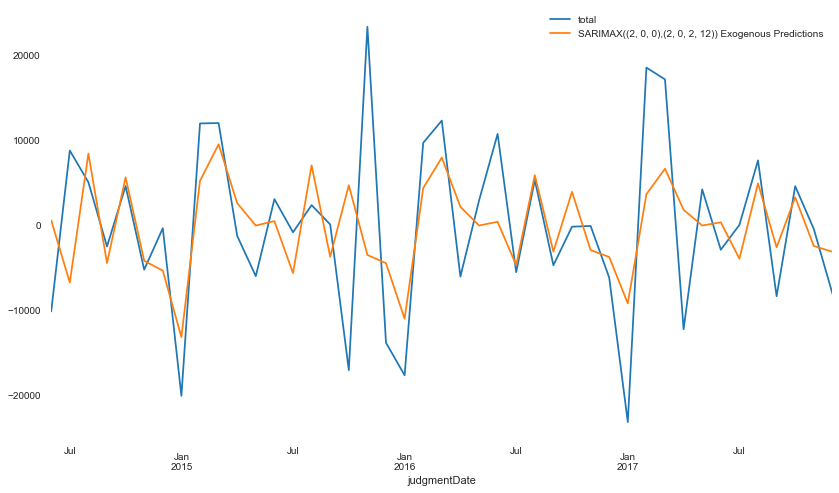

SARIMAX:                                 8416.83357249019


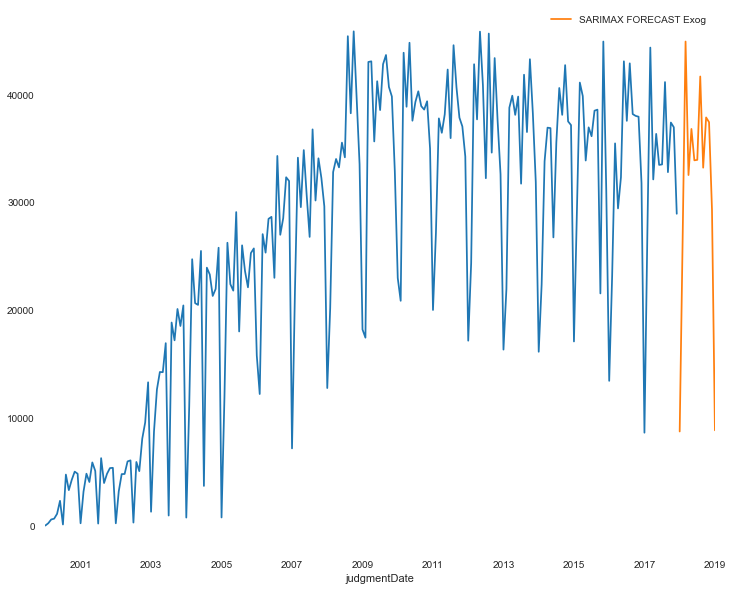

In [43]:
start=len(trainDiff)
end=len(trainDiff)+len(testDiff)-1

predictionsARMAExog = resultARMAExog.predict(start=start, end=end,exogenous=np.tile(dfSeasonalDiff['seasonal'].values, 2)).rename(f'SARIMAX({ARIMAauto_arima.order},{ARIMAauto_arima.seasonal_order}) Exogenous Predictions')
ax = testDiff[field].plot(legend=True,figsize=(14,8))
predictionsARMAExog.plot(legend=True)
ax.autoscale(axis='x',tight=True)
plt.show()
print(adjust('SARIMAX: ',40),forecast_accuracy(testDiff[field], predictionsARMAExog)['rmse'])


modelARIMAExog = SARIMAX(dfChoosed[field],order=ARIMAauto_arimaExog.order,seasonal_order=ARIMAauto_arimaExog.seasonal_order,enforce_invertibility=False,enforce_stationarity=False)
resultsForeCastARIMAExog = modelARIMAExog.fit()
fcastARIMAExog = resultsForeCastARIMAExog.predict(len(dfChoosed),len(dfChoosed)+predictFieldPeriod,type='levels')
dfChoosed[field].plot(figsize=(12,10))
fcastARIMAExog.rename('SARIMAX FORECAST Exog').plot(legend=True)


In [44]:
import rpy2
print(rpy2.__version__)
from rpy2.robjects import default_converter,pandas2ri,r
from rpy2.robjects.conversion import Converter, localconverter
from rpy2.robjects.packages import importr
import rpy2.robjects as robjects

base = importr('nnet')
base = importr('forecast')
base = importr('base')
utils = importr('utils')
jurimetrics = importr('jurimetrics')
ts=robjects.r('ts')
pandas2ri.activate()

3.3.1


In [45]:
rdataAll = ts((dfChoosed[field]),frequency=12)
rdataTrain = ts((dfChoosed[field][:-predictFieldPeriod]),frequency=12)
rdataTest = ts((dfChoosed[field][-predictFieldPeriod:]),frequency=12)

print(len(rdataTrain))
print(len(rdataTest))

204
12


In [46]:
d = pd.date_range(start='2000-01-01', end='2030-12-01', freq='MS')   


frequence = ''

if dfChoosed[field]['2016'].count() == 12:
    frequence = 'MS'

if dfChoosed[field]['2016'].count() == 4:
    frequence = 'QS'
    
if dfChoosed[field]['2016'].count() == 1:
    frequence = 'A'
    
robjects.globalenv['r_timeseriesTrain'] = rdataTrain
robjects.globalenv['r_timeseriesAll'] = rdataAll

# NNETAR

12 12
NNETAR:                                  5108.663778416146


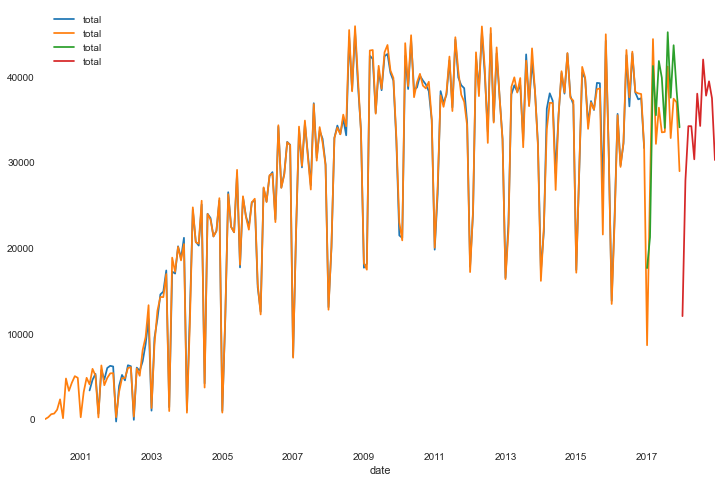

In [47]:
pred2NNETAR = robjects.r('(forecast::nnetar(r_timeseriesTrain))')
fcastNNetar = robjects.r('as.data.frame(forecast::forecast(forecast::nnetar(r_timeseriesTrain),h='+str(predictFieldPeriod)+'))')

fcastFutureNNetar = robjects.r('as.data.frame(forecast::forecast(forecast::nnetar(r_timeseriesAll),h='+str(predictFieldPeriod)+'))')

dfR = pd.DataFrame(pd.Series(d[0:len(pred2NNETAR[9])]))
dfNNetarFC = pd.DataFrame(pd.Series(d[len(pred2NNETAR[9]):len(pred2NNETAR[9])+predictFieldPeriod]))
dfNNetarFCFuture = pd.DataFrame(pd.Series(d[len(rdataAll):len(rdataAll)+predictFieldPeriod]))


dfR[field] = pd.Series(pred2NNETAR[9]).values
dfNNetarFC[field] = fcastNNetar.values
dfNNetarFCFuture[field] = fcastFutureNNetar.values

dfR.columns=['date',field]
dfR.index = pd.to_datetime(dfR['date'])
dfR.freq = frequence
dfR = dfR[[field]]

dfNNetarFC.columns=['date',field]
dfNNetarFC.index = pd.to_datetime(dfNNetarFC['date'])
dfNNetarFC.freq = frequence
dfNNetarFC = dfNNetarFC[[field]]

dfNNetarFCFuture.columns=['date',field]
dfNNetarFCFuture.index = pd.to_datetime(dfNNetarFCFuture['date'])
dfNNetarFCFuture.freq = frequence
dfNNetarFCFuture = dfNNetarFCFuture[[field]]

dfR.plot(legend=True,figsize=figsize)
dfChoosed[field].plot(legend=True)
dfNNetarFC[field].plot(legend=True)
dfNNetarFCFuture[field].plot(legend=True)

print(len(rdataTest),len(dfNNetarFC[field].values))
print(adjust('NNETAR: ',40), forecast_accuracy(rdataTest,dfNNetarFC[field].values)['rmse'])


12 12
ETS:                                     9420.611175424645


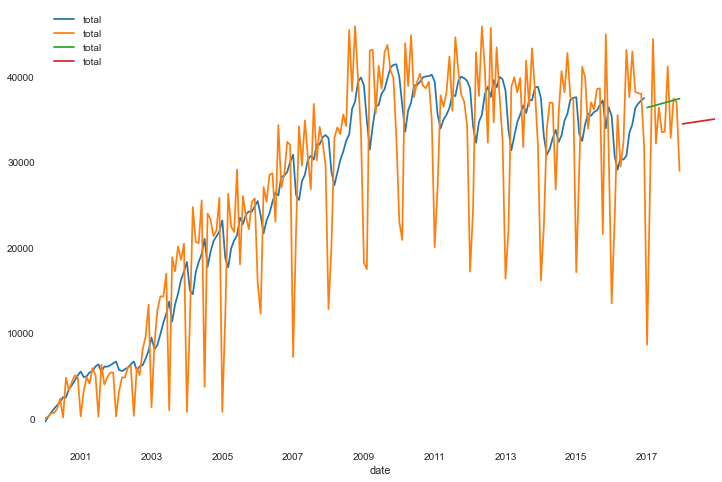

In [48]:
pred2ETS = robjects.r('(forecast::ets(r_timeseriesTrain))')
fcastETS = robjects.r('as.data.frame(forecast::forecast(forecast::ets(r_timeseriesTrain),h='+str(predictFieldPeriod)+'))')
fcastFutureETS = robjects.r('as.data.frame(forecast::forecast(forecast::ets(r_timeseriesAll),h='+str(predictFieldPeriod)+'))')

predETS = pred2ETS[8]#[:,0]

dfRETS = pd.DataFrame(pd.Series(d[0:len(predETS)]))
dfETSFC = pd.DataFrame(pd.Series(d[len(predETS):len(predETS)+predictFieldPeriod]))
dfETSFuture = pd.DataFrame(pd.Series(d[len(rdataAll):len(rdataAll)+predictFieldPeriod]))

coluna = fcastETS.columns[0]

dfRETS[field] = pd.DataFrame(pd.Series(predETS))
dfETSFC[field] = fcastETS[coluna].values
dfETSFuture[field] = fcastFutureETS[coluna].values

dfRETS.columns=['date',field]
dfRETS.index = pd.to_datetime(dfRETS['date'])
dfRETS.freq = frequence
dfRETS = dfRETS[[field]]

dfETSFC.columns=['date',field]
dfETSFC.index = pd.to_datetime(dfETSFC['date'])
dfETSFC.freq = frequence
dfETSFC = dfETSFC[[field]]

dfETSFuture.columns=['date',field]
dfETSFuture.index = pd.to_datetime(dfETSFuture['date'])
dfETSFuture.freq = frequence
dfETSFuture = dfETSFuture[[field]]

dfRETS.plot(legend=True,figsize=figsize)
dfChoosed[field].plot(legend=True)
dfETSFC[field].plot(legend=True)
dfETSFuture[field].plot(legend=True)

print(len(rdataTest),len(dfETSFC[field].values))
print(adjust('ETS: ',40), forecast_accuracy(rdataTest,dfETSFC[field].values)['rmse'])


12 12
TBATS:                                   8426.752907262886


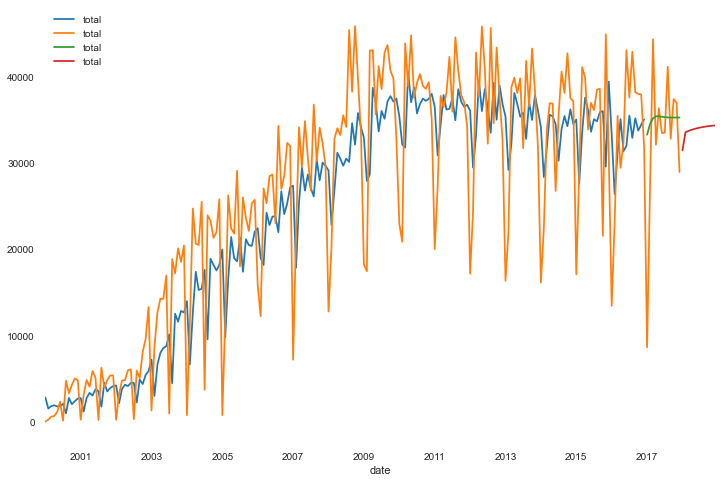

In [49]:
pred2TBATS = robjects.r('(forecast::tbats(r_timeseriesTrain))')
fcasttTBATS = robjects.r('as.data.frame(forecast::forecast(forecast::tbats(r_timeseriesTrain),h='+str(predictFieldPeriod)+'))')
fcastFutureTBATS = robjects.r('as.data.frame(forecast::forecast(forecast::tbats(r_timeseriesAll),h='+str(predictFieldPeriod)+'))')

#display(pred2TBATS[13])

dfRTBATS = pd.DataFrame(pd.Series(d[0:len(pred2TBATS[13])]))
dfTBATS = pd.DataFrame(pd.Series(d[len(pred2TBATS[13]):len(pred2TBATS[13])+predictFieldPeriod]))
dfTBATSFuture = pd.DataFrame(pd.Series(d[len(rdataAll):len(rdataAll)+predictFieldPeriod]))

coluna = fcasttTBATS.columns[0]

dfRTBATS[field] = pd.DataFrame(pd.Series(pred2TBATS[13]))
dfTBATS[field] = fcasttTBATS[coluna].values
dfTBATSFuture[field] = fcastFutureTBATS[coluna].values

dfRTBATS.columns=['date',field]
dfRTBATS.index = pd.to_datetime(dfRTBATS['date'])
dfRTBATS.freq = frequence
dfRTBATS = dfRTBATS[[field]]

dfTBATS.columns=['date',field]
dfTBATS.index = pd.to_datetime(dfTBATS['date'])
dfTBATS.freq = frequence
dfTBATS = dfTBATS[[field]]

dfTBATSFuture.columns=['date',field]
dfTBATSFuture.index = pd.to_datetime(dfTBATSFuture['date'])
dfTBATSFuture.freq = frequence
dfTBATSFuture = dfTBATSFuture[[field]]

dfRTBATS.plot(legend=True,figsize=figsize)
dfChoosed[field].plot(legend=True)
dfTBATS[field].plot(legend=True)
dfTBATSFuture[field].plot(legend=True)

print(len(rdataTest),len(dfTBATS[field].values))
print(adjust('TBATS: ',40), forecast_accuracy(rdataTest,dfTBATS[field].values)['rmse'])

In [50]:
display(df_count_day_typeGRP)

,Agravo,Agravo Embargos Infringentes,Agravo Inominado,Agravo Interno,Agravo Lei,Agravo Regimental,Agravo de Instrumento,Agravo de Instrumento em Recurso Extraordinario,Agravo de Petição,Agravo em Execução,...,Suspenção de Liminar ou Antecipação de Tutela,Termo Circunstanciado,Tutela Antecipada Antecedente,Tutela Cautelar Antecedente,Tutela Provisoria,Uniformização de Jurisprudência,weekDay,weekType,Feriado,total
judgmentDate,,,,,,,,,,,,,,,,,,,,,
2000-01-03,0,0,0,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,1,1,2
2000-01-04,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,1,0
2000-01-05,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,1,1,0
2000-01-06,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,3,1,1,1
2000-01-07,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,4,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-25,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2017-12-26,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,1,0
2017-12-27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,1,1,0


# VAR 

In [51]:
#eliminar duplicidade para analise
uniqueTypesComparison = []
for i in dfUniqueTypes:
    for i1 in dfUniqueTypes:
        if i != i1:
            if {i1,i} not in uniqueTypesComparison:
                uniqueTypesComparison.append({i,i1})
            

print(len(dfUniqueTypes),len(uniqueTypesComparison))

119 7021


In [55]:
dfVAR = dfChoosed[VARFields]
#dfVAR = dfChoosed[['Agravo de Instrumento','Embargos de Declaração']]
dfVAR['month'] = dfVAR.index.month
dfVAR

,Apelação Cível,Agravo de Instrumento,Embargos de Declaração,Recurso Cível,Agravo,Apelação Crime,Habeas Corpus,Apelação e Reexame Necessário,Reexame Necessário,Recurso Crime,month
judgmentDate,,,,,,,,,,,
2000-01-01,0,10,0,0,0,0,0,0,0,0,1
2000-02-01,151,35,2,0,4,1,0,25,1,0,2
2000-03-01,277,93,30,0,17,5,0,118,21,0,3
2000-04-01,343,145,19,0,18,3,2,89,14,0,4
2000-05-01,595,318,78,0,11,7,3,53,16,0,5
...,...,...,...,...,...,...,...,...,...,...,...
2017-08-01,9180,7284,5763,4238,1977,2912,1440,843,295,287,8
2017-09-01,6915,6131,3648,3040,1700,2465,1423,741,229,431,9
2017-10-01,8114,6538,4982,4923,1382,2406,1103,679,366,319,10


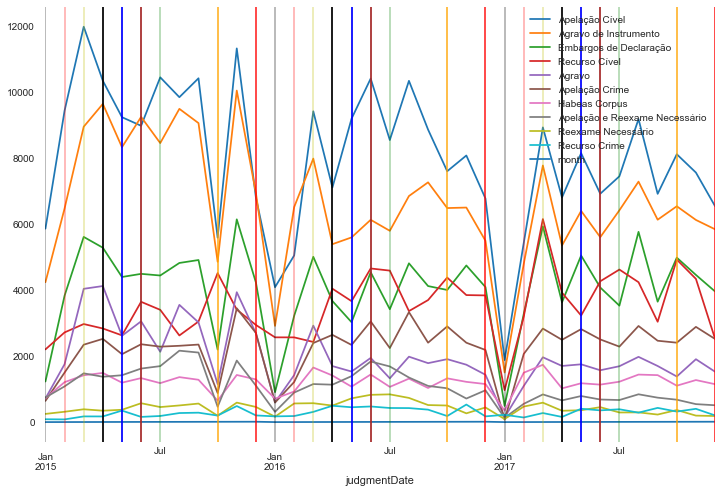

In [56]:
dfAnalise = dfVAR['2015':]
ax = dfAnalise.plot(figsize=(12,8))
ax.autoscale(axis='x',tight=True)
for x in dfAnalise.query('month==1').index: 
    ax.axvline(x=x, color='k', alpha = 0.3);
for x in dfAnalise.query('month==2').index: 
    ax.axvline(x=x, color='r', alpha = 0.3);
for x in dfAnalise.query('month==3').index: 
    ax.axvline(x=x, color='y', alpha = 0.3);
for x in dfAnalise.query('month==4').index: 
    ax.axvline(x=x, color='black', alpha = 1);
for x in dfAnalise.query('month==5').index: 
    ax.axvline(x=x, color='blue', alpha = 1);
for x in dfAnalise.query('month==6').index: 
    ax.axvline(x=x, color='brown', alpha = 1);
for x in dfAnalise.query('month==7').index:     
    ax.axvline(x=x, color='g', alpha = 0.3);
for x in dfAnalise.query('month==10').index:     
    ax.axvline(x=x, color='orange', alpha = 0.8);
for x in dfAnalise.query('month==12').index:     
    ax.axvline(x=x, color='red', alpha = 0.8);

216 214
Strong evidence against the null hypothesis 
 Reject the null hypothesis 
 Data has no unit root and is stationary
Strong evidence against the null hypothesis 
 Reject the null hypothesis 
 Data has no unit root and is stationary
Strong evidence against the null hypothesis 
 Reject the null hypothesis 
 Data has no unit root and is stationary
Strong evidence against the null hypothesis 
 Reject the null hypothesis 
 Data has no unit root and is stationary
Strong evidence against the null hypothesis 
 Reject the null hypothesis 
 Data has no unit root and is stationary
Strong evidence against the null hypothesis 
 Reject the null hypothesis 
 Data has no unit root and is stationary
Strong evidence against the null hypothesis 
 Reject the null hypothesis 
 Data has no unit root and is stationary
Strong evidence against the null hypothesis 
 Reject the null hypothesis 
 Data has no unit root and is stationary
Strong evidence against the null hypothesis 
 Reject the null hypothesis

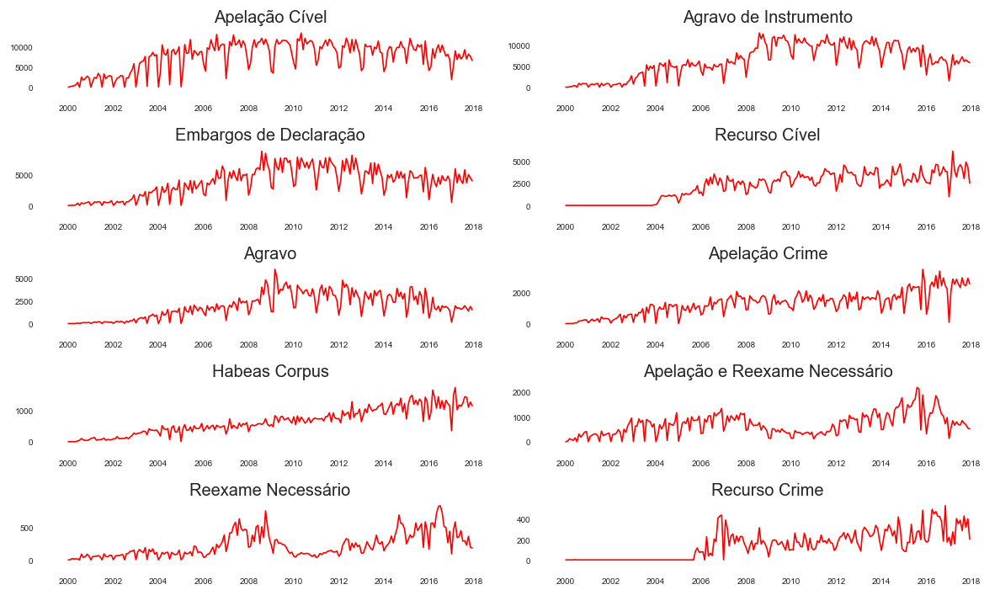

In [57]:
#checar se todos os componentes do VAR são estacionarios 
if 'month' in dfVAR.columns:
    del dfVAR['month']

dfVARDiff = dfVAR.copy()
hasOne = False

for coluna in dfVARDiff.columns:
    while(adf_teste(dfVARDiff[coluna])[0] >= 0.05):
        dfVARDiff = dfVARDiff.diff().dropna()
        break;

print(len(dfVAR),len(dfVARDiff.dropna()))        
    
#testa de novo    
for coluna in dfVARDiff.columns:
    print(adf_teste(dfVARDiff[coluna])[7])
    
fig, axes = plt.subplots(nrows=5, ncols=2, dpi=120, figsize=(10,6))
for i, ax in enumerate(axes.flatten()):
    data = dfVAR[dfVAR.columns[i]]
    ax.plot(data, color='red', linewidth=1)
    # Decorations
    ax.set_title(dfVAR.columns[i])
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)
    
plt.tight_layout();

In [58]:
#fig, axes = plt.subplots(nrows=5, ncols=2, dpi=120, figsize=(10,6))
#for i, ax in enumerate(axes.flatten()):
#    data = dfVARDiff[dfVARDiff.columns[i]]
#    ax.plot(data, color='red', linewidth=1)
#    # Decorations
#    ax.set_title(dfVARDiff.columns[i])
#    ax.xaxis.set_ticks_position('none')
#    ax.yaxis.set_ticks_position('none')
#    ax.spines["top"].set_alpha(0)
#    ax.tick_params(labelsize=6)   
#    
#plt.tight_layout();

In [59]:
from statsmodels.tsa.stattools import grangercausalitytests
maxlag=12
test = 'ssr_chi2test'
def grangers_causation_matrix(data, variables, test='ssr_chi2test', verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            #print(r,c)
            #TooDifferent
            #if TooDifferent(r,c):
            #    print('tirando {r} e {c}')                
            #else:                
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

#dfListOfTypes

#dfCorrelationGrangerMatrixStationary = grangers_causation_matrix(dfVARDiff, variables = dfVARDiff.columns) 
dfCorrelationGrangerMatrixNonStationary = grangers_causation_matrix(dfVAR, variables = dfVAR.columns) 

In [60]:
#import seaborn as sns
#f, ax = plt.subplots(figsize=(10,8))
#sns.heatmap(dfCorrelationGrangerMatrixStationary, 
#            xticklabels=dfCorrelationGrangerMatrixStationary.columns.values,
#            yticklabels=dfCorrelationGrangerMatrixStationary.index.values,center=0,vmax=.09,square=True,cmap="YlGnBu",annot=True) 

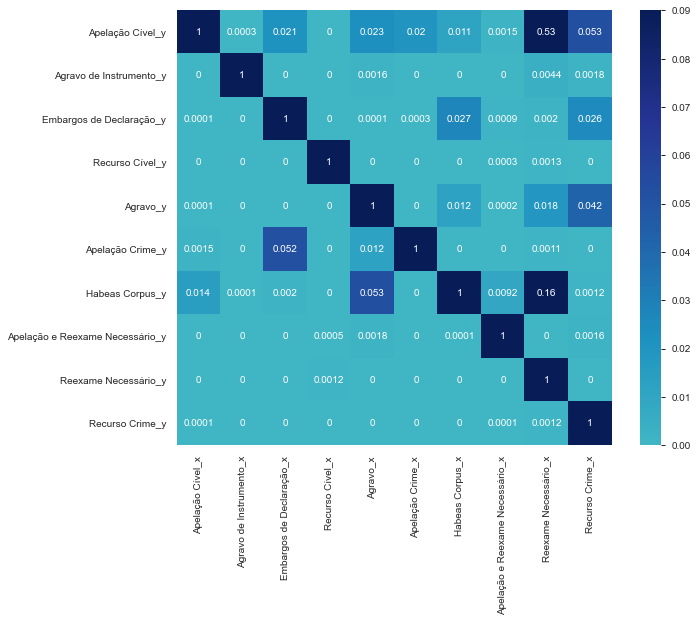

In [61]:
import seaborn as sns
f, ax = plt.subplots(figsize=(10,8))
sns.heatmap(dfCorrelationGrangerMatrixNonStationary, 
            xticklabels=dfCorrelationGrangerMatrixNonStationary.columns.values,
            yticklabels=dfCorrelationGrangerMatrixNonStationary.index.values,center=0,vmax=.09,square=True,cmap="YlGnBu",annot=True) 

In [62]:
import plotly.graph_objects as go

fig = go.Figure()

for i in dfVAR.columns:
    fig.add_trace(go.Scatter(x=dfVAR.reset_index()['judgmentDate'], y=dfVAR[i],
                    mode='lines',
                    name=i))
fig.show()

#fig2 = go.Figure()
#
#for i in dfVARDiff.columns:
#    fig2.add_trace(go.Scatter(x=dfVARDiff.reset_index()['judgmentDate'], y=dfVARDiff[i],
#                    mode='lines',
#                    name=i))
#fig2.show()


In [63]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen

def adjust(val, length= 6): return str(val).ljust(length)


def cointegration_test(df, alpha=0.05): 
    """Perform Johanson's Cointegration Test and Report Summary"""
    out = coint_johansen(df,-1,5)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col,35), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

cointegration_test(dfVAR)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Apelação Cível                      ::  286.32    > 219.4051  =>   True
Agravo de Instrumento               ::  212.4     > 179.5199  =>   True
Embargos de Declaração              ::  151.91    > 143.6691  =>   True
Recurso Cível                       ::  94.86     > 111.7797  =>   False
Agravo                              ::  63.02     > 83.9383   =>   False
Apelação Crime                      ::  36.58     > 60.0627   =>   False
Habeas Corpus                       ::  22.87     > 40.1749   =>   False
Apelação e Reexame Necessário       ::  9.71      > 24.2761   =>   False
Reexame Necessário                  ::  4.13      > 12.3212   =>   False
Recurso Crime                       ::  0.2       > 4.1296    =>   False


In [64]:
#cointegration_test(dfVARDiff)

In [65]:
nobs = sazonalPeriod
dfVAR_train, dfVAR_test = dfVAR[0:-nobs], dfVAR[-nobs:]


In [66]:
dfVAR_test

,Apelação Cível,Agravo de Instrumento,Embargos de Declaração,Recurso Cível,Agravo,Apelação Crime,Habeas Corpus,Apelação e Reexame Necessário,Reexame Necessário,Recurso Crime
judgmentDate,,,,,,,,,,
2017-01-01,1879,1504,489,968,147,74,350,131,93,222
2017-02-01,5425,4793,3275,3194,1095,2064,1496,554,471,140
2017-03-01,8927,7773,5931,6150,1964,2833,1737,839,589,275
2017-04-01,6805,5351,3630,3920,1701,2493,1022,658,344,157
2017-05-01,8146,6397,5045,3229,1751,2817,1177,790,360,405
2017-06-01,6918,5602,4077,4266,1571,2505,1136,685,453,356
2017-07-01,7446,6416,3528,4621,1693,2287,1224,669,292,389
2017-08-01,9180,7284,5763,4238,1977,2912,1440,843,295,287
2017-09-01,6915,6131,3648,3040,1700,2465,1423,741,229,431


In [67]:
dfVARDifference = dfVAR.copy()

for coluna in dfVARDifference.columns:
    while(adf_teste(dfVARDifference[coluna])[0] >= 0.05):
        dfVARDifference = dfVARDifference.diff().dropna()
        break;

for coluna in dfVARDifference.columns:
     if adf_teste(dfVARDifference[coluna])[0] >= 0.05:
        print('erro')       

In [68]:
model = VAR(dfVARDifference)
for i in [1,2,3,4,5,6,7,8,9]:
    try:
        result = model.fit(i)
        print('Lag Order =', i)
        print('AIC : ', result.aic)
        print('BIC : ', result.bic)
        print('FPE : ', result.fpe)
        print('HQIC: ', result.hqic, '\n')
    except:
        print('erro, \n')
        continue

model.select_order(9).summary()

Lag Order = 1
AIC :  122.53953721458149
BIC :  124.2754157978117
FPE :  1.654414187100315e+53
HQIC:  123.24106352809581 

Lag Order = 2
AIC :  120.26567155045511
BIC :  123.59059191687551
FPE :  1.712175688914468e+52
HQIC:  121.6095266962767 

Lag Order = 3
AIC :  118.96731850234433
BIC :  123.89184940934707
FPE :  4.7440864603060394e+51
HQIC:  120.9579117036309 

Lag Order = 4
AIC :  118.50339065792457
BIC :  125.03821964646819
FPE :  3.0720074872964385e+51
HQIC:  121.14517984038868 

Lag Order = 5
AIC :  117.32943572339168
BIC :  125.48537097938237
FPE :  9.98081029045012e+50
HQIC:  120.62692824474324 

Lag Order = 6
AIC :  116.9475317694196
BIC :  126.73550402238982
FPE :  7.357207408624843e+50
HQIC:  120.9052851623882 

Lag Order = 7
AIC :  116.37977560270011
BIC :  127.81084006269244
FPE :  4.665895843453309e+50
HQIC:  121.00239833193305 

Lag Order = 8
AIC :  115.91767777708296
BIC :  129.00301611067306
FPE :  3.4419227082162964e+50
HQIC:  121.20983001022185 

Lag Order = 9
AIC :

,AIC,BIC,FPE,HQIC
0,128.0,128.1,3.798e+55,128.0
1,122.9,124.7,2.464e+53,123.7
2,120.6,124.0*,2.500e+52,122.0
3,119.3,124.3,6.735e+51,121.3
4,118.8,125.5,4.206e+51,121.5
5,117.6,125.8,1.293e+51,120.9*
6,117.2,127.0,9.150e+50,121.2
7,116.5,128.0,5.459e+50,121.2
8,116.0,129.1,3.740e+50,121.3
9,115.2*,129.9,2.026e+50*,121.1


In [69]:
model_fitted = model.fit(9)
model_fitted.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 24, May, 2020
Time:                     13:14:07
--------------------------------------------------------------------
No. of Equations:         10.0000    BIC:                    129.923
Nobs:                     205.000    HQIC:                   121.138
Log likelihood:          -13803.9    FPE:                2.02601e+50
AIC:                      115.172    Det(Omega_mle):     5.14354e+48
--------------------------------------------------------------------
Results for equation Apelação Cível
                                      coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------------------------
const                                  -20.667339       143.992686           -0.144           0.886
L1.Apelação Cível                       -1.152577         0.197668         

Checking for Residuals' Autocorrelaotion

We'll use Durbin-Watson test for this (denoted as d):

The value of d always lies between 0 and 4.

d = 2 indicates no autocorrelation.

If d < 2, there is evidence of positive serial correlation. As a rough rule of thumb, if d < 1.0, there may be cause > for alarm. Small values of d indicate successive error terms are positively correlated.

If d > 2, successive error terms are negatively correlated. In regressions, this can imply an underestimation of the > level of statistical significance.

Taken from (modified by the author): Durbin–Watson statistic

In [70]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(model_fitted.resid)

for col, val in zip(dfVARDifference.columns, out):
    detail = ""
    if  round(val, 2) > 2:
        detail = "Negative Serial Correlation"
    else:
        detail = "Positive Serial Correlation"
    print((adjust(col)+':').ljust(30, ' '), round(val, 2), ' ' + detail)

Apelação Cível:                2.04  Negative Serial Correlation
Agravo de Instrumento:         2.03  Negative Serial Correlation
Embargos de Declaração:        1.97  Positive Serial Correlation
Recurso Cível:                 2.09  Negative Serial Correlation
Agravo:                        1.92  Positive Serial Correlation
Apelação Crime:                1.87  Positive Serial Correlation
Habeas Corpus:                 1.94  Positive Serial Correlation
Apelação e Reexame Necessário: 2.16  Negative Serial Correlation
Reexame Necessário:            2.04  Negative Serial Correlation
Recurso Crime:                 2.03  Negative Serial Correlation


In [71]:
lag_order = model_fitted.k_ar
print(lag_order)  #> 4

# Input data for forecasting
forecast_input = dfVARDifference.values[-lag_order:]
forecast_input

9


array([[-5624., -5402., -4957., -5186., -1132., -1109.,  -956.,  -466.,
         -363.,  -253.],
       [ 3463.,  3468.,  3716.,  1539.,   313.,   664.,   870.,   313.,
          261.,   366.],
       [-2569., -1841., -2383.,  1728.,  -230.,  -636.,  -196.,  -237.,
           77.,  -297.],
       [ 1756.,  1609.,   419.,  -682.,   302.,    94.,   129.,    89.,
         -254.,    82.],
       [ 1206.,    54.,  2784.,  -738.,   162.,   843.,   128.,   190.,
          164.,  -135.],
       [-3999., -2021., -4350.,  -815.,  -561., -1072.,  -233.,  -276.,
          -69.,   246.],
       [ 3464.,  1560.,  3449.,  3081.,   -41.,   388.,  -303.,    40.,
          203.,  -256.],
       [-1754.,  -821., -1857., -2467.,   841.,   538.,   491.,   -72.,
         -306.,   196.],
       [ -462.,   131.,    22., -1230.,  -901.,  -845.,  -296.,   100.,
          157.,  -284.]])

In [72]:
fc = model_fitted.forecast(y=forecast_input, steps=nobs)
print(dfVAR.shape,fc.shape)
df_forecast = pd.DataFrame(fc, index=dfVAR.index[-nobs:], columns=dfVAR.columns + '_2d')
df_forecast

(216, 10) (12, 10)


,Apelação Cível_2d,Agravo de Instrumento_2d,Embargos de Declaração_2d,Recurso Cível_2d,Agravo_2d,Apelação Crime_2d,Habeas Corpus_2d,Apelação e Reexame Necessário_2d,Reexame Necessário_2d,Recurso Crime_2d
judgmentDate,,,,,,,,,,
2017-01-01,-3478.738089,-4134.470203,-1672.480234,1699.192663,-576.157123,-593.587147,212.806473,-832.147616,-252.795576,328.614156
2017-02-01,7602.576222,7232.696697,2144.728641,348.250544,438.642111,1181.669429,-301.015969,1350.706083,341.287823,-217.693972
2017-03-01,-2108.489026,-2723.769738,1902.662862,-915.235969,2368.026407,387.203394,637.498322,-439.086842,24.111184,94.175072
2017-04-01,-2882.813002,-2422.053446,-4156.455574,1009.685390,-3368.261084,-709.964524,-702.085412,-119.857393,-232.276842,53.910723
2017-05-01,2842.852004,4092.648301,3384.325046,90.739987,2026.710768,-319.503187,353.494113,-20.302781,181.470875,-72.814217
2017-06-01,-966.655551,-2549.910699,-1392.583322,-2138.160246,-622.086826,379.192389,-229.088845,8.945096,-154.863448,-70.165600
2017-07-01,-2693.566763,-537.406447,-759.623171,2430.279461,-281.516849,98.880545,422.261409,-211.768739,85.024828,177.331698
2017-08-01,6542.923683,4291.055009,2999.575653,-447.614641,1325.864480,639.259449,-320.705924,723.540334,58.143231,-165.689031
2017-09-01,-5945.302647,-6099.396027,-4569.669518,-1247.352729,-1923.410627,-1749.374932,-164.061998,-1037.031886,-256.517282,75.985831


In [73]:
def invert_transformation(df_train, df_forecast, second_diff=False):
    """Revert back the differencing to get the forecast to original scale."""
    df_fc = df_forecast.copy()
    columns = df_train.columns
    for col in columns:        
        # Roll back 2nd Diff
        if second_diff:
            df_fc[str(col)+'_1d'] = (df_train[col].iloc[-1]-df_train[col].iloc[-2]) + df_fc[str(col)+'_2d'].cumsum()
        # Roll back 1st Diff
        df_fc[str(col)+'_forecast'] = df_train[col].iloc[-1] + df_fc[str(col)+'_1d'].cumsum()
    return df_fc

In [74]:
df_results = invert_transformation(dfVAR_train, df_forecast, second_diff=True) 

colunas =[]
for i in df_results.columns:
    if 'forecast' in i:
        colunas.append(i)
print(colunas)

df_results.loc[:, colunas]

['Apelação Cível_forecast', 'Agravo de Instrumento_forecast', 'Embargos de Declaração_forecast', 'Recurso Cível_forecast', 'Agravo_forecast', 'Apelação Crime_forecast', 'Habeas Corpus_forecast', 'Apelação e Reexame Necessário_forecast', 'Reexame Necessário_forecast', 'Recurso Crime_forecast']


,Apelação Cível_forecast,Agravo de Instrumento_forecast,Embargos de Declaração_forecast,Recurso Cível_forecast,Agravo_forecast,Apelação Crime_forecast,Habeas Corpus_forecast,Apelação e Reexame Necessário_forecast,Reexame Necessário_forecast,Recurso Crime_forecast
judgmentDate,,,,,,,,,,
2017-01-01,1991.261911,352.529797,1762.519766,5527.192663,552.842877,1371.412853,1298.806473,383.852384,369.204424,144.614156
2017-02-01,4812.100043,2444.756290,1579.768173,7564.635869,110.327865,1739.495136,1143.596977,1153.410850,635.696672,-102.465660
2017-03-01,5524.449150,1813.213047,3299.679442,8686.843106,2035.839261,2494.780813,1625.885802,1483.882474,926.300103,-255.370404
2017-04-01,3353.985256,-1240.383643,863.135137,10818.735734,593.089572,2540.101966,1406.089215,1694.496706,984.626691,-354.364426
2017-05-01,4026.373365,-201.332031,1810.915879,13041.368349,1177.050651,2265.919933,1539.786741,1884.808156,1224.424155,-526.172665
2017-06-01,3732.105923,-1712.191119,1366.113297,13125.840719,1138.924905,2370.930288,1444.395421,2084.064702,1309.358172,-768.146504
2017-07-01,744.271718,-3760.456653,161.687545,15640.592549,819.282310,2574.821188,1771.265511,2071.552510,1479.317016,-832.788644
2017-08-01,4299.361197,-1517.667179,1956.837446,17707.729739,1825.504195,3417.971537,1777.429676,2782.580651,1707.419092,-1063.119817
2017-09-01,1909.148029,-5374.273732,-817.682171,18527.514199,908.315452,2511.746954,1619.531843,2456.576907,1679.003886,-1217.465158


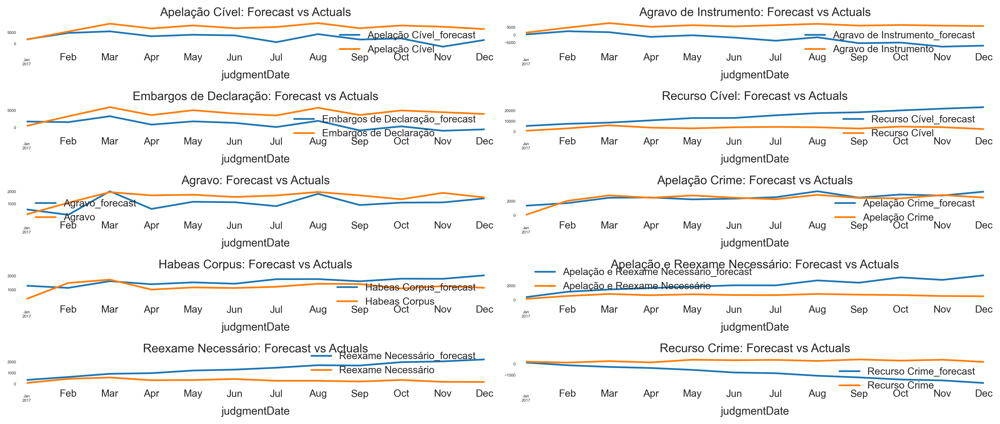

In [75]:
fig, axes = plt.subplots(nrows=int(len(dfVAR.columns)/2), ncols=2, dpi=300, figsize=(14,6))
for i, (col,ax) in enumerate(zip(dfVAR.columns, axes.flatten())):
    df_results[col+'_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    dfVAR_test[col][-nobs:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    #ax.xaxis.set_ticks_position('none')
    #ax.yaxis.set_ticks_position('none')
    #ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=4)

plt.tight_layout();

In [76]:
from statsmodels.tsa.stattools import acf
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None],actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None],actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    return({'mape':mape, 'me':me, 'mae': mae,'mpe': mpe, 'rmse':rmse, 'corr':corr, 'minmax':minmax})

for i in colunas:
    print(i)
    itemI = i.replace('_forecast','')
    print(f'Forecast Accuracy of: {itemI}')
    accuracy_prod = forecast_accuracy(df_results[i].values, dfVAR_test[itemI])
    for k, v in accuracy_prod.items():
        print(adjust(k), ': ', round(v,4))
    print('\n')

Apelação Cível_forecast
Forecast Accuracy of: Apelação Cível
mape   :  0.5661
me     :  -4218.6724
mae    :  4237.3827
mpe    :  -0.5562
rmse   :  4818.6475
corr   :  0.1899
minmax :  0.5658


Agravo de Instrumento_forecast
Forecast Accuracy of: Agravo de Instrumento
mape   :  1.3723
me     :  -8212.8369
mae    :  8212.8369
mpe    :  -1.3723
rmse   :  9050.2656
corr   :  -0.2084
minmax :  1.3723


Embargos de Declaração_forecast
Forecast Accuracy of: Embargos de Declaração
mape   :  0.9781
me     :  -3156.5103
mae    :  3368.7636
mpe    :  -0.544
rmse   :  3570.1324
corr   :  0.1789
minmax :  0.8213


Recurso Cível_forecast
Forecast Accuracy of: Recurso Cível
mape   :  3.288
me     :  10901.7316
mae    :  10901.7316
mpe    :  3.288
rmse   :  12219.1073
corr   :  0.1681
minmax :  0.7094


Agravo_forecast
Forecast Accuracy of: Agravo
mape   :  0.5555
me     :  -463.944
mae    :  543.5577
mpe    :  -0.0893
rmse   :  644.5393
corr   :  0.5984
minmax :  0.3865


Apelação Crime_forecast
Fore

# FACEBOOK PROPHET

In [77]:
from fbprophet import Prophet

dfProphet = dfChoosed[[field]].copy()

dfProphetTrain = dfProphet[:'2016']
dfProphetTrain = dfProphetTrain.reset_index()
dfProphetTrain.columns = ['ds','y']

dfProphetTest = dfProphet['2016':]
dfProphetTest = dfProphetTest.reset_index()
dfProphetTest.columns = ['ds','y']

dfProphet = dfProphet.reset_index()
dfProphet.columns = ['ds','y']

# ANALISE PARA INDICAÇOES DE SAZONALIDADE 

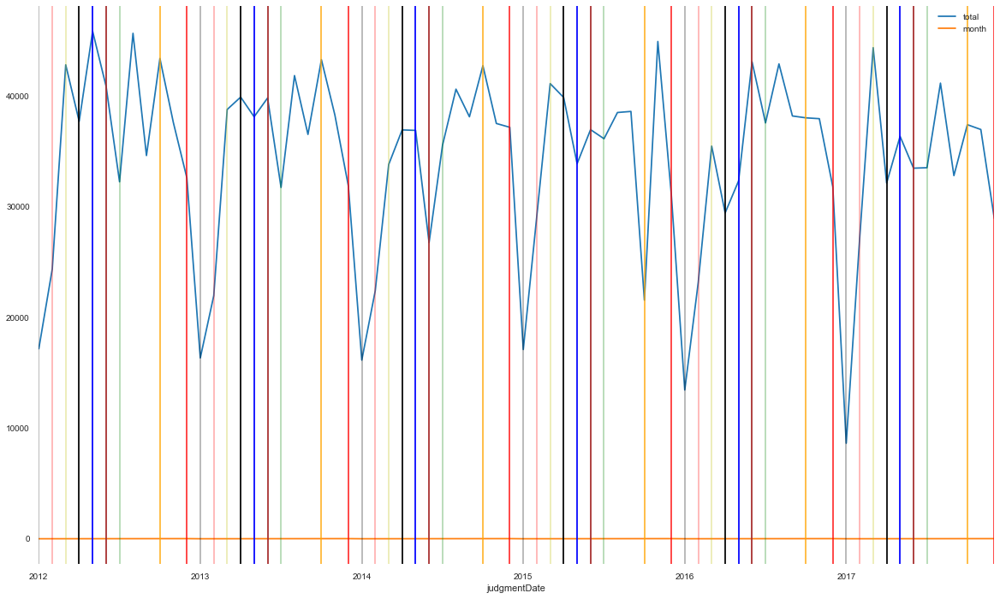

In [78]:
dfAnalise = dfChoosed.copy()
dfAnalise['month'] = dfAnalise.index.month
dfAnalise = dfAnalise[[field,'month']]['2012':]
ax = dfAnalise.plot(figsize=(20,12))
ax.autoscale(axis='x',tight=True)
for x in dfAnalise.query('month==1').index: 
    ax.axvline(x=x, color='k', alpha = 0.3);
for x in dfAnalise.query('month==2').index: 
    ax.axvline(x=x, color='r', alpha = 0.3);
for x in dfAnalise.query('month==3').index: 
    ax.axvline(x=x, color='y', alpha = 0.3);
for x in dfAnalise.query('month==4').index: 
    ax.axvline(x=x, color='black', alpha = 1);
for x in dfAnalise.query('month==5').index: 
    ax.axvline(x=x, color='blue', alpha = 1);
for x in dfAnalise.query('month==6').index: 
    ax.axvline(x=x, color='brown', alpha = 1);
for x in dfAnalise.query('month==7').index:     
    ax.axvline(x=x, color='g', alpha = 0.3);
for x in dfAnalise.query('month==10').index:     
    ax.axvline(x=x, color='orange', alpha = 0.8);
for x in dfAnalise.query('month==12').index:     
    ax.axvline(x=x, color='red', alpha = 0.8);

In [79]:
#dias com sazonalidade baixa .... 
dfZERADO = df_count_day_type.resample('D').sum()
dfZeradoDiaMes = dfZERADO[dfZERADO['count']<=10]
dfZeradoDiaMes['mes'] = dfZeradoDiaMes.index.month
dfZeradoDiaMes['dia'] = dfZeradoDiaMes.index.day
dfDayLowResult = dfZeradoDiaMes.groupby(['mes','dia']).count().sort_values(by='Feriado',ascending=False)
dfDayLowResult = dfDayLowResult[dfDayLowResult['Feriado']>=9].reset_index()
dfDayLowResult

,mes,dia,count,weekDay,Dia,Mes,Ano,Feriado,total
0,1,1,17,17,17,17,17,17,17
1,12,25,17,17,17,17,17,17,17
2,2,2,16,16,16,16,16,16,16
3,9,7,15,15,15,15,15,15,15
4,12,31,15,15,15,15,15,15,15
5,5,1,14,14,14,14,14,14,14
6,12,24,14,14,14,14,14,14,14
7,11,2,14,14,14,14,14,14,14
8,9,20,13,13,13,13,13,13,13
9,4,21,13,13,13,13,13,13,13


In [80]:
import datetime

preNatalPreAnoNovo = []

for year in range(2000,2026):
    preNatalPreAnoNovo.append(pd.to_datetime(f'{year}-12-24',format='%Y-%m-%d'))
    preNatalPreAnoNovo.append(pd.to_datetime(f'{year}-12-31',format='%Y-%m-%d'))
    preNatalPreAnoNovo.append(pd.to_datetime(f'{year}-09-20',format='%Y-%m-%d'))
    preNatalPreAnoNovo.append(pd.to_datetime(f'{year}-09-07',format='%Y-%m-%d'))
    preNatalPreAnoNovo.append(pd.to_datetime(f'{year}-11-15',format='%Y-%m-%d'))    
    preNatalPreAnoNovo.append(pd.to_datetime(f'{year}-02-02',format='%Y-%m-%d'))
    #preNatalPreAnoNovo.append(pd.to_datetime(f'{year}-05-01',format='%Y-%m-%d'))
    preNatalPreAnoNovo.append(pd.to_datetime(f'{year}-11-02',format='%Y-%m-%d'))
    #preNatalPreAnoNovo.append(pd.to_datetime(f'{year}-04-21',format='%Y-%m-%d'))
    #preNatalPreAnoNovo.append(pd.to_datetime(f'{year}-10-12',format='%Y-%m-%d'))
    #preNatalPreAnoNovo.append(pd.to_datetime(f'{year}-10-12',format='%Y-%m-%d'))
    for dia in range(20,32):
        preNatalPreAnoNovo.append(pd.to_datetime(f'{year}-12-{dia}',format='%Y-%m-%d'))
    for dia in range(1,7):
        preNatalPreAnoNovo.append(pd.to_datetime(f'{year}-01-{dia}',format='%Y-%m-%d'))
        
preNatalAnoNovoOutrosFeriados = pd.Series(preNatalPreAnoNovo).drop_duplicates()    
display(len(preNatalAnoNovoOutrosFeriados))

598

# PREPARACAO DOS DADOS 

In [81]:
dfFeriados = df_count_day_type.reset_index()
dfFeriados = dfFeriados[['judgmentDate','Feriado']]
feriados = pd.Series(dfFeriados[dfFeriados['Feriado']==True]['judgmentDate'])
np.array(feriados)

feriadosGauchos = pd.DataFrame({
  'holiday': 'feriadosGauchos',
  'ds': pd.to_datetime(feriados),
  'lower_window': 0,
  'upper_window': 1,
})

np.array

feriadosAntecipados = pd.DataFrame({
  'holiday': 'feriadosAntecipados',
   'ds': preNatalAnoNovoOutrosFeriados,
  'lower_window': 0,
  'upper_window': 1,
})

feriadosGerais = pd.concat((feriadosGauchos, feriadosAntecipados))



def is_not_year_season(ds):
    date = pd.to_datetime(ds)
    return (date.month == 4 or date.month ==1 or date.month ==10 or date.month ==5)

dfProphet['on_season'] = ~dfProphet['ds'].apply(is_not_year_season)
dfProphet['off_season'] = dfProphet['ds'].apply(is_not_year_season)


dfProphetTrain['on_season'] = ~dfProphetTrain['ds'].apply(is_not_year_season)
dfProphetTrain['off_season'] = dfProphetTrain['ds'].apply(is_not_year_season)


frequence = ''

if dfChoosed[field]['2016'].count() == 12:
    frequence = 'MS'

if dfChoosed[field]['2016'].count() == 4:
    frequence = 'QS'
    
if dfChoosed[field]['2016'].count() == 1:
    frequence = 'A'
    
    

In [82]:
mProphet = Prophet(yearly_seasonality=sazonalPeriod,changepoint_prior_scale=180,holidays=feriadosGerais)
mProphet.add_seasonality(name='monthly', period=12, fourier_order=8)
mProphet.add_country_holidays(country_name='BR')
mProphet.fit(dfProphetTrain)
display('Feriados BR',mProphet.train_holiday_names)
#display(mProphet.holidays)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


'Feriados BR'

0               feriadosGauchos
1           feriadosAntecipados
2                New Year's Day
3                    Tiradentes
4                  Worker's Day
5              Independence Day
6    Our Lady of the Apparition
7                All Souls' Day
8     Republic Proclamation Day
9                     Christmas
dtype: object

In [83]:
futureProphet = mProphet.make_future_dataframe(periods=predictFieldPeriod,freq=frequence)
futureProphet.tail()
forecastProphet = mProphet.predict(futureProphet)
forecastProphet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
211,2017-08-01,40962.413031,31369.062548,50305.012236
212,2017-09-01,35872.014302,24114.103344,45732.450670
213,2017-10-01,38129.246520,24255.207014,49958.233217
214,2017-11-01,36059.159492,19583.038351,49531.458071
215,2017-12-01,34111.968611,13968.804519,51521.160438


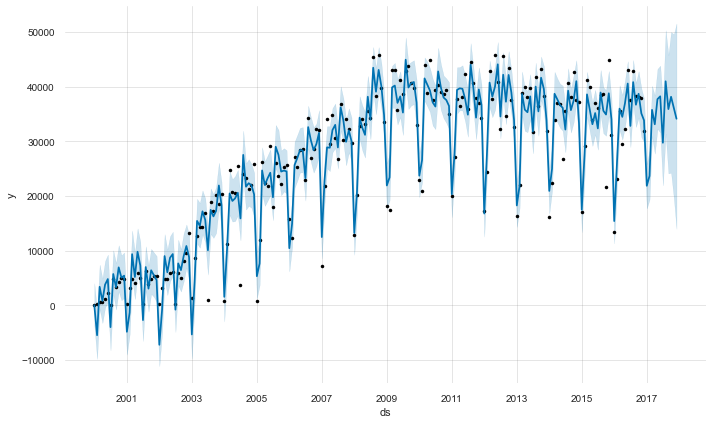

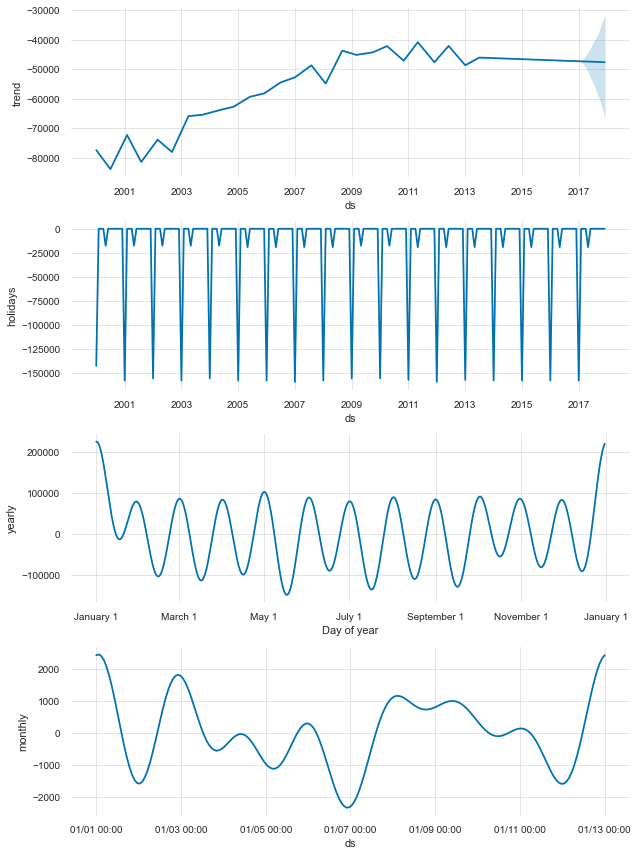

In [84]:
fig1 = mProphet.plot(forecastProphet[:])
fig2 = mProphet.plot_components(forecastProphet[:])

In [85]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()
figProphet = plot_plotly(mProphet, forecastProphet)  # This returns a plotly Figure
py.iplot(figProphet)
dfFaceForecast = forecastProphet

In [86]:
#display(dfChoosed[[field]].tail())
#display(forecastProphet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail())


FACEBOOK PROPHET:                        3341.602782603631


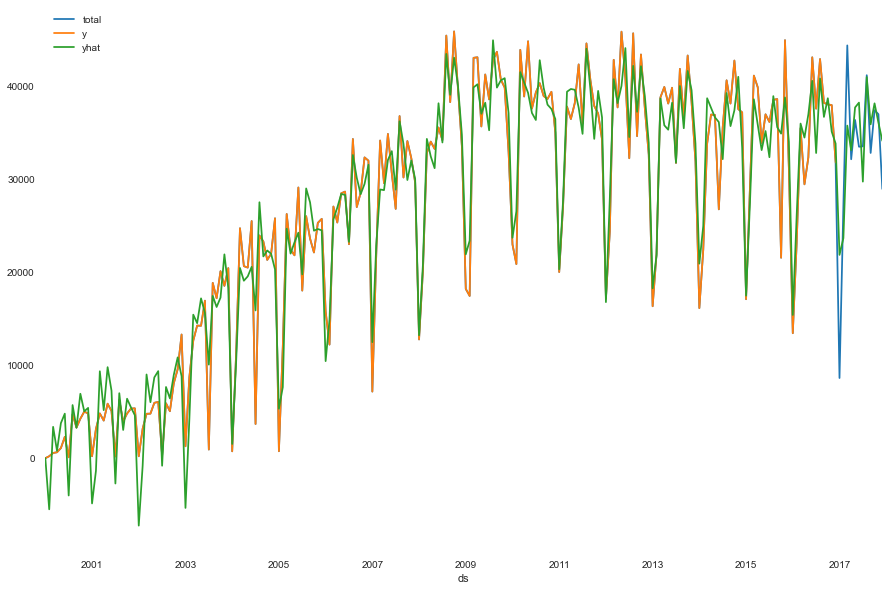

In [87]:
dfFaceForecast.index = pd.to_datetime(dfFaceForecast['ds'])
dfProphetTrain.index = pd.to_datetime(dfProphetTrain['ds'])
dfChoosed[field].plot(figsize=(15,10),legend=True)
dfProphetTrain['y'].plot(figsize=(15,10),legend=True)
forecastProphet['yhat'].plot(legend=True)

print(adjust('FACEBOOK PROPHET: ',40), forecast_accuracy(dfProphet['y'].values,forecastProphet['yhat'].values)['rmse'])

In [88]:
#FACEBOOK PROPHET:                        3410.6127764365747
#FACEBOOK PROPHET:                        3407.1908733806695
#FACEBOOK PROPHET:                        3343.0582487657043 melhorado parametro do fourier_order
#FACEBOOK PROPHET:                        3341.602782603631  adicionado recesso judiciario 


In [89]:
#colocando as datas de 24/12 e 31/12 como feriados o modelo ficou ainda melhor, mesmo se tratando de uma analise mensal
#melhorou em 0050
#acerto nao melhorou mt mais colocando todas as datas possiveis

# LSTM

Using TensorFlow backend.


Epoch 1/100
 - 1s - loss: 0.0615
Epoch 2/100
 - 0s - loss: 0.0235
Epoch 3/100
 - 0s - loss: 0.0198
Epoch 4/100
 - 0s - loss: 0.0174
Epoch 5/100
 - 0s - loss: 0.0146
Epoch 6/100
 - 0s - loss: 0.0126
Epoch 7/100
 - 0s - loss: 0.0110
Epoch 8/100
 - 0s - loss: 0.0104
Epoch 9/100
 - 0s - loss: 0.0099
Epoch 10/100
 - 0s - loss: 0.0108
Epoch 11/100
 - 0s - loss: 0.0094
Epoch 12/100
 - 0s - loss: 0.0094
Epoch 13/100
 - 0s - loss: 0.0093
Epoch 14/100
 - 0s - loss: 0.0092
Epoch 15/100
 - 0s - loss: 0.0097
Epoch 16/100
 - 0s - loss: 0.0087
Epoch 17/100
 - 0s - loss: 0.0087
Epoch 18/100
 - 0s - loss: 0.0084
Epoch 19/100
 - 0s - loss: 0.0091
Epoch 20/100
 - 0s - loss: 0.0084
Epoch 21/100
 - 0s - loss: 0.0090
Epoch 22/100
 - 0s - loss: 0.0085
Epoch 23/100
 - 0s - loss: 0.0082
Epoch 24/100
 - 0s - loss: 0.0092
Epoch 25/100
 - 0s - loss: 0.0082
Epoch 26/100
 - 0s - loss: 0.0093
Epoch 27/100
 - 0s - loss: 0.0090
Epoch 28/100
 - 0s - loss: 0.0082
Epoch 29/100
 - 0s - loss: 0.0089
Epoch 30/100
 - 0s - lo

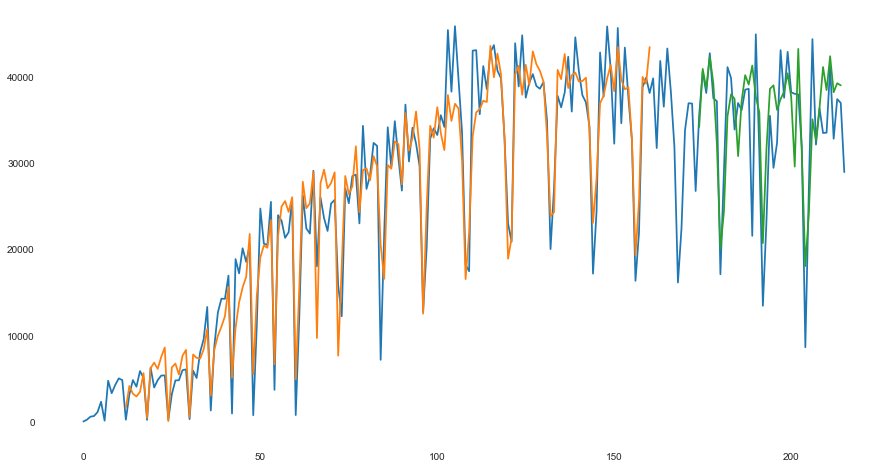

LTSM:                                    5632.098539485169


In [90]:
# LSTM for international airline passengers problem with window regression framing
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import ConvLSTM2D



# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=12):
    dataX, dataY = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return numpy.array(dataX), numpy.array(dataY)

dataframe = dfChoosed[[field]]

dataset = dataframe.values
#dataset = dataset.astype('float32')
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = int(len(dataset) * 0.75)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
look_back = 12
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)

trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

model = Sequential()

model.add(LSTM(50, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(dataset)
trainPredictPlot[:, :] = numpy.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = numpy.empty_like(dataset)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(dataset))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

print(adjust('LTSM: ',40), forecast_accuracy(testY[0], testPredict[:,0])['rmse'])

Epoch 1/50
 - 2s - loss: 0.1224
Epoch 2/50
 - 1s - loss: 0.0297
Epoch 3/50
 - 1s - loss: 0.0286
Epoch 4/50
 - 1s - loss: 0.0265
Epoch 5/50
 - 1s - loss: 0.0243
Epoch 6/50
 - 1s - loss: 0.0239
Epoch 7/50
 - 1s - loss: 0.0186
Epoch 8/50
 - 1s - loss: 0.0169
Epoch 9/50
 - 1s - loss: 0.0160
Epoch 10/50
 - 1s - loss: 0.0129
Epoch 11/50
 - 1s - loss: 0.0125
Epoch 12/50
 - 1s - loss: 0.0104
Epoch 13/50
 - 1s - loss: 0.0105
Epoch 14/50
 - 1s - loss: 0.0105
Epoch 15/50
 - 1s - loss: 0.0097
Epoch 16/50
 - 1s - loss: 0.0092
Epoch 17/50
 - 1s - loss: 0.0103
Epoch 18/50
 - 1s - loss: 0.0092
Epoch 19/50
 - 0s - loss: 0.0072
Epoch 20/50
 - 0s - loss: 0.0080
Epoch 21/50
 - 0s - loss: 0.0084
Epoch 22/50
 - 0s - loss: 0.0078
Epoch 23/50
 - 0s - loss: 0.0101
Epoch 24/50
 - 0s - loss: 0.0086
Epoch 25/50
 - 0s - loss: 0.0075
Epoch 26/50
 - 0s - loss: 0.0076
Epoch 27/50
 - 0s - loss: 0.0071
Epoch 28/50
 - 0s - loss: 0.0072
Epoch 29/50
 - 0s - loss: 0.0071
Epoch 30/50
 - 0s - loss: 0.0076
Epoch 31/50
 - 0s -

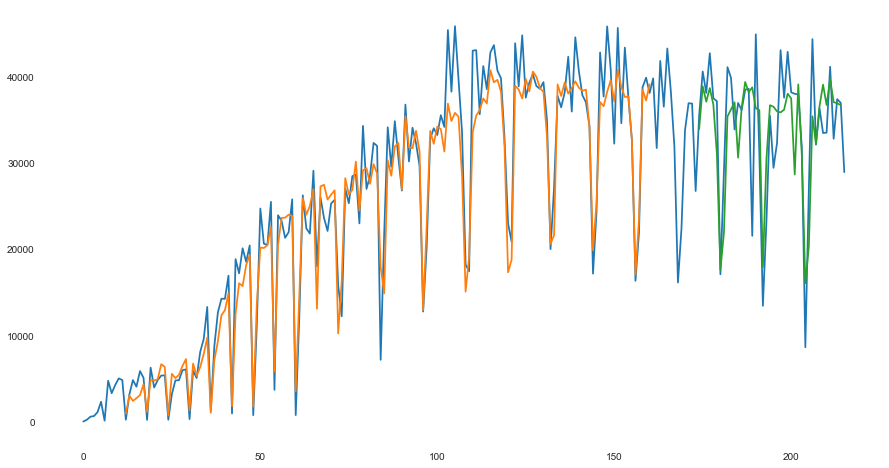

LTSM:                                    5305.890791218012


In [91]:
# LSTM for international airline passengers problem with window regression framing
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import ConvLSTM2D

numpy.random.seed(7)

# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=12):
    dataX, dataY = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return numpy.array(dataX), numpy.array(dataY)

dataframe = dfChoosed[[field]]

dataset = dataframe.values
#dataset = dataset.astype('float32')
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = int(len(dataset) * 0.75)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 12
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
# create and fit the LSTM network
model = Sequential()

# make predictions LTSM:                                    8354.0303039746
#model.add(LSTM(50, input_shape=(1, look_back)))
#model.add(Dense(1))
#model.compile(loss='mean_squared_error', optimizer='adam')
#model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)
#-----
# make predictions LTSM:                                    8354.0303039746

model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(1, look_back)))
model.add(Dropout(2))
model.add(LSTM(50, activation='relu', return_sequences=True))
model.add(Dropout(0.1))
model.add(LSTM(50, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)


# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(dataset)
trainPredictPlot[:, :] = numpy.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = numpy.empty_like(dataset)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(dataset))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

print(adjust('LTSM: ',40), forecast_accuracy(testY[0], testPredict[:,0])['rmse'])

Epoch 1/100
 - 1s - loss: 0.1365
Epoch 2/100
 - 0s - loss: 0.0343
Epoch 3/100
 - 0s - loss: 0.0274
Epoch 4/100
 - 0s - loss: 0.0276
Epoch 5/100
 - 0s - loss: 0.0223
Epoch 6/100
 - 0s - loss: 0.0301
Epoch 7/100
 - 0s - loss: 0.0264
Epoch 8/100
 - 0s - loss: 0.0222
Epoch 9/100
 - 0s - loss: 0.0204
Epoch 10/100
 - 0s - loss: 0.0217
Epoch 11/100
 - 0s - loss: 0.0199
Epoch 12/100
 - 0s - loss: 0.0184
Epoch 13/100
 - 0s - loss: 0.0182
Epoch 14/100
 - 0s - loss: 0.0139
Epoch 15/100
 - 0s - loss: 0.0148
Epoch 16/100
 - 0s - loss: 0.0150
Epoch 17/100
 - 0s - loss: 0.0122
Epoch 18/100
 - 0s - loss: 0.0136
Epoch 19/100
 - 0s - loss: 0.0172
Epoch 20/100
 - 0s - loss: 0.0130
Epoch 21/100
 - 0s - loss: 0.0144
Epoch 22/100
 - 0s - loss: 0.0120
Epoch 23/100
 - 0s - loss: 0.0117
Epoch 24/100
 - 0s - loss: 0.0132
Epoch 25/100
 - 0s - loss: 0.0101
Epoch 26/100
 - 0s - loss: 0.0148
Epoch 27/100
 - 0s - loss: 0.0122
Epoch 28/100
 - 0s - loss: 0.0095
Epoch 29/100
 - 0s - loss: 0.0121
Epoch 30/100
 - 0s - lo

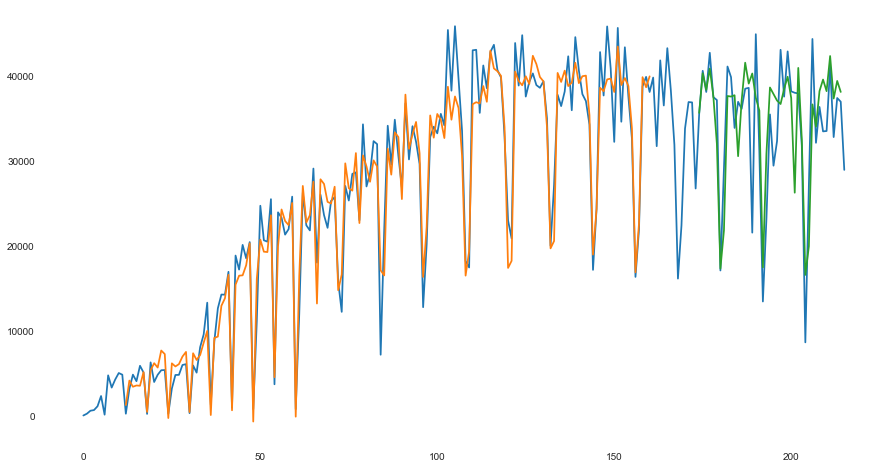

LTSM:                                    5509.503125455127


In [92]:
# LSTM for international airline passengers problem with window regression framing
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import ConvLSTM2D

# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=12):
    dataX, dataY = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return numpy.array(dataX), numpy.array(dataY)

dataframe = dfChoosed[[field]]

dataset = dataframe.values
#dataset = dataset.astype('float32')
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = int(len(dataset) * 0.75)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 12
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
# create and fit the LSTM network
model = Sequential()

# make predictions LTSM:                                    8354.0303039746
#model.add(LSTM(50, input_shape=(1, look_back)))
#model.add(Dense(1))
#model.compile(loss='mean_squared_error', optimizer='adam')
#model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)
#-----
# make predictions LTSM:                                    8354.0303039746

n_features=1 
n_steps = 1
model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(1, look_back)))
model.add(Dropout(0.2))
model.add(LSTM(50, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(n_features))
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)


# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(dataset)
trainPredictPlot[:, :] = numpy.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = numpy.empty_like(dataset)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(dataset))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

print(adjust('LTSM: ',40), forecast_accuracy(testY[0], testPredict[:,0])['rmse'])

In [93]:
dfPredictLtsm = pd.DataFrame(testPredictPlot)
dfPredictLtsm.index = d[0:len(testPredictPlot)]
dfPredictLtsm.columns = [field]
display(dfPredictLtsm)

,total
2000-01-01,NaN
2000-02-01,NaN
2000-03-01,NaN
2000-04-01,NaN
2000-05-01,NaN
...,...
2017-08-01,42346.687500
2017-09-01,37341.832031
2017-10-01,39410.671875
2017-11-01,38114.085938


# RESUMO

In [94]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Scatter(x=dfChoosed.reset_index()['judgmentDate'], y=dfChoosed[field],mode='lines',name='Real'))
fig.add_trace(go.Scatter(x=dfSimpleExpSmooth.reset_index()['judgmentDate'], y=dfSimpleExpSmooth['DESmul'+str(predictFieldPeriod)],mode='lines',name='Exponential Smoothing - DESmul'+str(predictFieldPeriod)))
fig.add_trace(go.Scatter(x=predictions1.index, y=predictions1.values,mode='lines',name='AR Pred'))
fig.add_trace(go.Scatter(x=predictions2.index, y=predictions2.values,mode='lines',name='AR Pred - MaxLag2'))
fig.add_trace(go.Scatter(x=predictions11.index, y=predictions11.values,mode='lines',name='AR Pred (11) - Auto'))
fig.add_trace(go.Scatter(x=fcastAR.index, y=fcastAR.values,mode='lines',name='AR FORECAST'))
#fig.add_trace(go.Scatter(x=predictionsARMA.index, y=predictionsARMA,mode='lines',name='SARIMA')) nao consegue por pois ele foi tornado estacionario
fig.add_trace(go.Scatter(x=fcastARIMANoSeasonal.index, y=fcastARIMANoSeasonal,mode='lines',name='SARIMA FORECAST SEM SAZONALIDADE'))
fig.add_trace(go.Scatter(x=fcastARIMA.index, y=fcastARIMA,mode='lines',name='SARIMA FORECAST'))
fig.add_trace(go.Scatter(x=fcastARIMAExog.index, y=fcastARIMAExog,mode='lines',name='SARIMA FORECAST EXOG'))
fig.add_trace(go.Scatter(x=dfNNetarFC.index, y=dfNNetarFC[field],mode='lines',name='NNETAR'))
fig.add_trace(go.Scatter(x=dfNNetarFCFuture.index, y=dfNNetarFCFuture[field],mode='lines',name='NNETAR FORECAST'))
fig.add_trace(go.Scatter(x=dfETSFC.index, y=dfETSFC[field],mode='lines',name='ETS'))
fig.add_trace(go.Scatter(x=dfTBATS.index, y=dfTBATS[field],mode='lines',name='TBATS'))
fig.add_trace(go.Scatter(x=dfProphetTrain['ds'], y=dfProphetTrain['y'],mode='lines',name='Treino Prophet'))
fig.add_trace(go.Scatter(x=forecastProphet['ds'], y=forecastProphet['yhat'],mode='lines',name='Forecast Prophet'))
fig.add_trace(go.Scatter(x=dfPredictLtsm.index, y=dfPredictLtsm[field],mode='lines',name='LTSM'))


fig.show()



print(adjust("Exponential Smoothing (additional): ",40),forecast_accuracy(dfSimpleExpSmooth['DESmul'+str(predictFieldPeriod)][-predictFieldPeriod:],HwForeCastAdd)['rmse'])
print(adjust("Exponential Smoothing (multiplicate): ",40),forecast_accuracy(dfSimpleExpSmooth['DESmul'+str(predictFieldPeriod)][-predictFieldPeriod:],HwForeCastMul)['rmse'])
for i in range(3):
    print(adjust(labelsAR[i]+':',40),forecast_accuracy(arTest[field], ArimaPreds[i])['rmse'])

print(adjust('SARIMAX No Seasonal: ',40),forecast_accuracy(testDiff[field], predictionsARMANoSeasonal)['rmse'])    
print(adjust('SARIMAX: ',40),forecast_accuracy(testDiff[field], predictionsARMA)['rmse'])
print(adjust('SARIMAX Exogenous: ',40),forecast_accuracy(testDiff[field], predictionsARMAExog)['rmse'])
print(adjust('NNETAR: ',40), forecast_accuracy(rdataTest,dfNNetarFC['total'].values)['rmse'])
print(adjust('ETS: ',40), forecast_accuracy(rdataTest,dfETSFC[field].values)['rmse'])
print(adjust('TBATS: ',40), forecast_accuracy(rdataTest,dfTBATS[field].values)['rmse'])
print(adjust('FACEBOOK PROPHET: ',40), forecast_accuracy(dfProphet['y'].values,forecastProphet['yhat'].values)['rmse'])
print(adjust('LTSM: ',40), forecast_accuracy(testY[0],testPredict[:,0])['rmse'])

Exponential Smoothing (additional):      6716.590273332058
Exponential Smoothing (multiplicate):    7365.420027868237
AR(1):                                   11018.575977425984
AR(2):                                   10181.79148359231
AR(14):                                  6184.545540141704
SARIMAX No Seasonal:                     10182.269626958234
SARIMAX:                                 8067.010684513909
SARIMAX Exogenous:                       8416.83357249019
NNETAR:                                  5108.663778416146
ETS:                                     9420.611175424645
TBATS:                                   8426.752907262886
FACEBOOK PROPHET:                        3341.602782603631
LTSM:                                    5509.503125455127
